# SSVEP Character Classification with DiffE

In [1]:
#!pip install ema-pytorch
#!pip install pytorch_metric_learning

In [2]:
import os
import sys

#!git clone https://github.com/diffe2023/Diff-E.git
#sys.path.append('/content/Diff-E')
sys.path.append('Diff-E')
#sys.path.append(r'C:\Users\shaoy\arl-eegmodels')

In [3]:
import math
from einops import reduce
from functools import partial
import random
import argparse
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchaudio.transforms as T
from torch.utils.data import Dataset, DataLoader
from ema_pytorch import EMA
from tqdm.notebook import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    f1_score,
    roc_auc_score,
    precision_score,
    recall_score,
    top_k_accuracy_score,
)

In [4]:
config = {
    'Name': 'Yucheng Shao',
    #'subset': 1,
    'batch_size': 384,
    
    'epochs_AEs': 500,
    'alpha': 0,
    'beta': 1,
    'gamma': 1,
    
    'num_classes': 26,
    'ddpm_dim': 128,
    'encoder_dim': 256,
    'fc_dim': 512,
    'n_T': 1000,
    'AE_base_lr': 9e-5,
    'AE_max_lr': 1.5e-3,

    'epochs_EEG': 500,
    'eeg_lr': 0.0012,
    'eeg_F1': 16,
    'eeg_F2': 32,
    'eeg_D': 2,
    'eeg_droupout': 0.6,
    'eeg_channels': 64,
    'eeg_samples': 250,
    'eeg_kernel_length': 64,
    'eeg_norm_rate': 0.25,
    'eeg_dropoutType': 'Dropout',  # 'Dropout' or 'SpatialDropout2D'
    
    #'eeg_pool_1': 4,
    #'eeg_pool_2': 8,

    'normalize_x': True,
    
    'eeg_tr_original': 0,
    'eeg_tr_ddpm': 1,
    'eeg_tr_CAE': 1,

    'eeg_in_original': 1,
    'eeg_in_ddpm': 0,
    'eeg_in_CAE': 0,

    'checkpoint_dir': r'C:\LTI 11785 Introduction to deep learning\project\SSVEP\checkpoints_separated',
    'augument': False,
    #'num_workers': 0
    # Include other parameters as needed.
}

In [5]:
# Uncomment this if you want to use Google Drive
#from google.colab import drive
#drive.mount('/content/drive')

#load and preprocess data


We retain the original SSVEP data preprocessing procedures, including:

    Chebyshev bandpass filtering (6–90 Hz),
    Noise removal and segmentation using a sliding window of 250 samples, followed by manual channel-wise standardization (subtracting the mean and dividing by the standard deviation),
    Downsampling from 1000 Hz to 250 Hz.

In this work, we directly load the preprocessed character-level files "S#_chars.npy" for subsequent training.

Unlike the original setup where models are trained separately for each subject, we train a single model jointly across all subjects by concatenating all subjects' data.

In [6]:
# Define a function to perform z-score normalization on the data
def zscore_norm(data):
    # Calculate the mean and standard deviation for each channel in each batch
    mean = torch.mean(data, dim=(1, 2))
    std = torch.std(data, dim=(1, 2))

    # Subtract the mean from each channel in each batch and divide by the standard deviation
    norm_data = (data - mean[:, None, None]) / std[:, None, None]

    return norm_data


# Define a function to perform min-max normalization on the data
def minmax_norm(data):
    # Calculate the minimum and maximum values for each channel and sequence in the batch
    min_vals = torch.min(data, dim=-1)[0]
    max_vals = torch.max(data, dim=-1)[0]

    # Scale the data to the range [0, 1]
    norm_data = (data - min_vals.unsqueeze(-1)) / (
        max_vals.unsqueeze(-1) - min_vals.unsqueeze(-1)
    )

    return norm_data

In [7]:
#define spectrogram
#time_frames = 1 + (signal_length - n_fft) // hop_length
#1 + (250 - 64) // 16 = 12 time frame
''' Not used.
spectrogram_transform = T.Spectrogram(
    n_fft=64,       # width of window. original: 128, but then the time_frame will become 0 when downsampling
    win_length=None, # default: n_fft
    hop_length=16, # default: win_length // 2
    normalized=True
)'''

' Not used.\nspectrogram_transform = T.Spectrogram(\n    n_fft=64,       # width of window. original: 128, but then the time_frame will become 0 when downsampling\n    win_length=None, # default: n_fft\n    hop_length=16, # default: win_length // 2\n    normalized=True\n)'

In [8]:
#used only for tsne plot
class EEGDataset(Dataset):
    "Characterizes a dataset for PyTorch"

    def __init__(self, X, Y, subject_ids=None, transform=None):
        "Initialization"
        self.X = X
        self.Y = Y
        self.subject_ids = subject_ids if subject_ids is not None else torch.zeros(len(Y), dtype=torch.long)
        self.transform = transform

    def __len__(self):
        return len(self.X)

    def __getitem__(self, index):
        x = self.X[index]
        y = self.Y[index]
        sid = self.subject_ids[index]

        if self.transform:
            x = self.transform(x)

        return x.squeeze(), y, sid

def load_data_by_session(root_dir, subject_id, session_idx_list):
    data = np.load(os.path.join(root_dir, f"S{subject_id}_chars.npy"))  # [26, 6, 64, 250]
    data = data[:, session_idx_list]  # [26, len(session), 64, 250]
    X = data.reshape(-1, 64, 250)
    Y = np.repeat(np.arange(26), len(session_idx_list))
    return torch.tensor(X, dtype=torch.float32), torch.tensor(Y, dtype=torch.long)

def load_split_dataset(root_dir, num_seen, seed=43):
    random.seed(seed)

    all_subjects = list(range(1, 36))
    seen_subjects = random.sample(all_subjects, num_seen)#25 seen
    unseen_subjects = [sid for sid in all_subjects if sid not in seen_subjects]#10 unseen

    split_cfg = {
        "train":  [(sid, [0, 1, 2, 3]) for sid in seen_subjects],
        "val":    [(sid, [4]) for sid in seen_subjects],
        "val2":    [(sid, [4]) for sid in seen_subjects],
        "test1":  [(sid, [5]) for sid in seen_subjects],
        "test2":  [(sid, [0, 1, 2, 3, 4, 5]) for sid in unseen_subjects]
    }

    print(f"[Split] Seen subjects (train/val/test1): {seen_subjects}")
    print(f"[Split] Unseen subjects (test2): {unseen_subjects}")

    loaders = {}
    subject_id_dict = {}

    for split, sid_sess in split_cfg.items():
        X_all, Y_all = [], []
        subject_ids = []
        for sid, sess in sid_sess:
            X, Y = load_data_by_session(root_dir, sid, sess)
            X_all.append(X)
            Y_all.append(Y)
            subject_ids.extend([sid] * len(Y))
        X_all = torch.cat(X_all, dim=0)
        Y_all = torch.cat(Y_all, dim=0)
        dataset = EEGDataset(X_all, Y_all, subject_ids=torch.tensor(subject_ids, dtype=torch.long))
        loaders[split] = DataLoader(dataset, batch_size=32, shuffle = (split in ["train", "val2"]))
        subject_id_dict[split] = torch.tensor(subject_ids, dtype=torch.long)

    # return subject_id list for t-SNE
    for split in ["train", "val"]:
        if split in subject_id_dict:
            loaders[f"{split}_subjects"] = subject_id_dict[split]
    return loaders

In [9]:
seed = 44
random.seed(seed)
torch.manual_seed(seed)
print("Random Seed: ", seed)

Random Seed:  44


In [10]:
#subject_chars_dir = '/content/drive/MyDrive/project/dataset/ssvep/chars' # Where to store all character data
subject_chars_dir = r'C:\LTI 11785 Introduction to deep learning\project\SSVEP\chars' # Where to store all character data
subject_ids = list(range(1, 36)) #35 samples + 1

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
batch_size = 32
batch_size2 = 260
seed = 44
shuffle = True

# load all subjects' data
loaders = load_split_dataset(subject_chars_dir, num_seen=33, seed=seed)
train_loader = loaders["train"]
val_loader = loaders["val"]
val2_loader = loaders["val2"]
test1_loader = loaders["test1"]
test2_loader = loaders["test2"]
train_iter = iter(train_loader)


[Split] Seen subjects (train/val/test1): [27, 34, 8, 12, 13, 33, 10, 1, 30, 4, 19, 28, 26, 6, 17, 29, 31, 25, 11, 32, 2, 22, 5, 20, 3, 15, 9, 16, 18, 24, 21, 7, 14]
[Split] Unseen subjects (test2): [23, 35]


In [11]:
print(">>> First 30 subject_ids from dataloader (sid):")
with torch.no_grad():
    x, y, sid = next(train_iter)
    print(sid[:30].tolist())

>>> First 30 subject_ids from dataloader (sid):
[15, 18, 24, 21, 24, 2, 28, 34, 19, 2, 12, 14, 22, 6, 17, 15, 10, 30, 26, 8, 21, 33, 18, 12, 20, 24, 32, 20, 34, 13]


In [12]:
print(len(train_loader.dataset), len(val_loader.dataset), len(test1_loader.dataset), len(test2_loader.dataset))

for x, y,_ in train_loader:
    print("X shape:", x.shape)
    print("Y shape:", y.shape)
    break  # the first batch

3432 858 858 312
X shape: torch.Size([32, 64, 250])
Y shape: torch.Size([32])


Since there are only six sessions, if keep 2 in val and tes1, there will be only 2 sessions left for train. Then the number of train data will be so small.

val:2 session

test1:2 sessions

test2:1 subject

all: 5460

train: 33 seen subjects × 4 session × 26 = 3432(0.63)

val: 33 × 1 × 26 = 858(0.157)

test1: 33 × 1 × 26 = 858(0.157)

test2: 2 unseen × 6 session × 26 = 312(0.057)

random choose 25 subjects as seen, the rest 10 as unseen

| Group Name | Subject Range   | Sessions Used         | Purpose                                  |
|------------|------------------|------------------------|-------------------------------------------|
| train      | seen subjects    | sessions [0, 1, 2, 3]  | Training (4 sessions)                     |
| val        | seen subjects    | session [4]            | Validation                                |
| test1      | seen subjects    | session [5]            | Test on unseen session of seen subjects  |
| test2      | unseen subjects  | sessions [0–5] (all)   | Test on unseen subjects                   |


#model

The overall model follows the original GitHub implementation, with a few necessary adjustments to align tensor time dimensions. Specifically, we aligned the temporal dimensions between up2 + temb and down1, up3 and x, and x_hat and x. These changes are clearly marked with comments in the code.




```
#transform from 1D to 2D:
current input: [batch_size, channels, freq_bins, time_frames]
original input: [batch_size, channels, time]

Replace all instances of Conv1d, MaxPool1d, and AvgPool1d with Conv2d, MaxPool2d, and AvgPool2d, respectively.
Also modify the AvgPool1d and MaxPool1d used in the Encoder and Decoder.
```



In [13]:
def safe_cat_and_add(a, b, temb):
    """
    Interpolates `a` to align with `b`, then adds `temb` (broadcasted) to `a`, and finally concatenates with `b`.

    Inputs:
        a: decoder upsampled output [B, C, F, T]
        b: encoder skip connection [B, C, F, T]
        temb: time embedding output, supports [B, C], [B, C, 1], etc., auto-adapts shape

    Output:
        Concatenated result [B, C_concat, F, T]
    """
    # Align spatial dimensions (freq, time)
    if a.shape[2:] != b.shape[2:]:
        a = F.interpolate(a, size=b.shape[2:], mode='nearest')

    # Normalize temb to shape [B, C, 1, 1]
    while temb.dim() < 4:
        temb = temb.unsqueeze(-1)
    if temb.dim() > 4:
        temb = temb.squeeze(-1)

    # Broadcast to shape [B, C, F, T]
    temb = temb.expand(-1, -1, a.shape[2], a.shape[3])

    # Element-wise addition and concatenation
    return torch.cat([a + temb, b], dim=1)

def safe_align_2d(x1, x2):
    """
    Align two 4D tensors in frequency and time dimensions (2D spatial alignment).

    Inputs:
        x1, x2: [B, C, F, T]

    Returns:
        Aligned x1, x2
    """
    target_freq = min(x1.shape[2], x2.shape[2])
    target_time = min(x1.shape[3], x2.shape[3])
    x1 = F.interpolate(x1, size=(target_freq, target_time), mode='nearest')
    x2 = F.interpolate(x2, size=(target_freq, target_time), mode='nearest')
    return x1, x2


def safe_align_1d(x1, x2):
    # Align the temporal dimension of x_hat and x
    if x_hat.shape[-1] != x.shape[-1]:
        target_len = min(x_hat.shape[-1], x.shape[-1])
        x1 = F.interpolate(x_hat, size=target_len)
        x2 = F.interpolate(x, size=target_len)
    return x1, x2

In [14]:
#define diffE model
def get_padding(kernel_size, dilation=1):
    return int((kernel_size * dilation - dilation) / 2)


# Swish activation function
class Swish(nn.Module):
    def __init__(self):
        super().__init__()
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        return x * self.sigmoid(x)


'''Create a sinusoidal positional embedding of the positions.'''
class SinusoidalPosEmb(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, x):
        device = x.device   # cast all operations on the same device
        half_dim = self.dim // 2
        # positional encoding uses sine and cosine for different dimensions
        # each position is split into half, for sine and cosine
        emb = math.log(10000) / (half_dim - 1)
        # calculate logarithmic spacing factor
        # wavelengths form a geometric progression from 2pi to 2e4pi
        # provide a variety of frequencies to encode different positions
        emb = torch.exp(torch.arange(half_dim, device=device) * -emb)
        # create a tensor of size (half_dim)
        # each entry is a step in the geometric progression
        # represents the scaling factor for each dimension of the positional encoding
        emb = x[:, None] * emb[None, :]
        # scales the positions in x by the scaling factors computed previously
        # broadcast to apply the scaling across all dimensions
        emb = torch.cat((emb.sin(), emb.cos()), dim=-1)
        # the sine and cosine functions are applied to the scaled positions
        # concatenate along the last dimension to form the final positional embedding
        return emb


"""
https://arxiv.org/abs/1903.10520
weight standardization purportedly works synergistically with group normalization
Standardize the weights of the convolution layers similarly to how batch norm
standarizes activations.
"""
class WeightStandardizedConv1d(nn.Conv1d):

    def forward(self, x):
        eps = 1e-5 if x.dtype == torch.float32 else 1e-3  # avoid divide by zero

        weight = self.weight  # convolutional weights of the layer
        mean = reduce(weight, "o ... -> o 1 1", "mean")
        # preserve the first dimension (o, output channel)
        # reduce all other dimensions to size 1 (mean across all filter dimensions)
        var = reduce(weight, "o ... -> o 1 1", partial(torch.var, unbiased=False))
        # computes the variance along all dimensions except the first
        # use biased estimator for variance calculation (i.e., divide by n and not n-1)
        normalized_weight = (weight - mean) * (var + eps).rsqrt()
        # normalize the weight with calculated mean and var

        return F.conv1d(  # class variables defined with nn.Convid
            x,
            normalized_weight,
            self.bias,
            self.stride,
            self.padding,
            self.dilation,
            self.groups,
        )



class ResidualConvBlock(nn.Module):  # inherits from nn.Module, a base class for a nn in PyTorch
    def __init__(self, inc: int, outc: int, kernel_size: int, stride=1, gn=8):
        super().__init__()
        """
        standard ResNet style convolutional block
        inc:         Number of input channels.
        outc:        Number of output channels.
        kernel_size: Size of the convolution kernel.
        stride:      Stride of the convolution, with a default of 1.
        gn:          Number of groups for Group Normalization, with a default of 8.
        """
        self.same_channels = inc == outc  # boolean flag if in and out channels equals
        self.ks = kernel_size
        self.conv = nn.Sequential(
            WeightStandardizedConv1d(inc, outc, self.ks, stride, get_padding(self.ks)),
            # weights are normalized to improve training
            nn.GroupNorm(gn, outc),
            # group normalization using gn groups
            # normalizes the outputs across specified group channels
            # help stabilize learning, forr small batch / diverse data distributions
            nn.PReLU(),
            # parametric ReLU
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x1 = self.conv(x)  # use the defined conv sequence to output x1
        if self.same_channels:  # residual connection if in and out channels equals
            out = (x + x1) / 2
        else:  # otherwise just output the x1
            out = x1
        return out


'''Downsample the input feature maps.'''
class UnetDown(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, gn=8, factor=2):
        '''
        in_channels:       Number of input channels.
        out_channels:      Number of output channels.
        kernel_size:       Size of the kernel in the convolutional layer.
        gn (optional):     Number of groups for group normalization in the convolutional block, with a default value of 8.
        factor (optional): The factor by which the spatial size will be reduced, with a default value of 2.
        '''
        super(UnetDown, self).__init__()
        # initializes the base class nn.Module
        self.pool = nn.MaxPool1d(factor)
        # 1d max pooling, reduce spatial dimensions by a factor of 'factor'
        self.layer = ResidualConvBlock(in_channels, out_channels, kernel_size, gn=gn)
        # call the previously defined residual conv block

    def forward(self, x):
        x = self.layer(x)  # do the 1d (residual) conv
        x = self.pool(x)   # then do the max pooling
        return x


'''Upsample the input feature maps.'''
class UnetUp(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, gn=8, factor=2):
        # same stuff, just upsample instead of downsample
        super(UnetUp, self).__init__()
        self.pool = nn.Upsample(scale_factor=factor, mode="nearest")
        # the upsample by a factor of 'factor' and using the nearest neighbor interpolation
        self.layer = ResidualConvBlock(in_channels, out_channels, kernel_size, gn=gn)
        # same thing

    def forward(self, x):
        x = self.pool(x)
        # do the upsampling first
        x = self.layer(x)
        # then call the conv
        return x


'''Embed an input into a higher-dimensional space using a fully connected network.'''
class EmbedFC(nn.Module):
    def __init__(self, input_dim, emb_dim):
        super(EmbedFC, self).__init__()
        """
        generic one layer FC NN for embedding things
        input_dim: The size of each input sample.
        emb_dim:   The size of the embedding dimension to which the input data is transformed.
        """
        self.input_dim = input_dim
        layers = [
            nn.Linear(input_dim, emb_dim),
            nn.PReLU(),
            nn.Linear(emb_dim, emb_dim),
        ]
        # layers to transform the input data
        # simply linear-activate-linear transform to get to embedding dimension
        self.model = nn.Sequential(*layers)
        # sequential model calling the previously defined layers

    def forward(self, x):
        x = x.view(-1, self.input_dim)
        # reshape x for correct number of features per data point
        # expected by the model input
        return self.model(x)  # return the output of the model


'''U-Net conditional on time t using sinusoidal positional embedding.'''
class ConditionalUNet(nn.Module):
    def __init__(self, in_channels, n_feat=256):
        super(ConditionalUNet, self).__init__()

        # number of input channels and features per layer
        self.in_channels = in_channels
        self.n_feat = n_feat

        # downsampling dimensions / num of features
        self.d1_out = n_feat * 1
        self.d2_out = n_feat * 2
        self.d3_out = n_feat * 3
        self.d4_out = n_feat * 4
        
        # upsampling dimensions / num of features
        self.u1_out = n_feat
        self.u2_out = n_feat
        self.u3_out = n_feat
        self.u4_out = in_channels

        # sinusoidal positional embedding
        self.sin_emb = SinusoidalPosEmb(n_feat)
        # self.timeembed1 = EmbedFC(n_feat, self.u1_out)
        # self.timeembed2 = EmbedFC(n_feat, self.u2_out)
        # self.timeembed3 = EmbedFC(n_feat, self.u3_out)

        # downsample and increase depth
        self.down1 = UnetDown(in_channels, self.d1_out, 1, gn=8, factor=2)
        self.down2 = UnetDown(self.d1_out, self.d2_out, 1, gn=8, factor=2)
        self.down3 = UnetDown(self.d2_out, self.d3_out, 1, gn=8, factor=2)

        # upsample and use skip connections
        self.up2 = UnetUp(self.d3_out, self.u2_out, 1, gn=8, factor=2)
        self.up3 = UnetUp(self.u2_out + self.d2_out, self.u3_out, 1, gn=8, factor=2)
        self.up4 = UnetUp(self.u3_out + self.d1_out, self.u4_out, 1, gn=8, factor=2)

        # combines the output of last upsampling step with original input
        self.out = nn.Conv1d(self.u4_out + in_channels, in_channels, 1)

    def forward(self, x, t):
        # call and sequentially downsample the input, reduce size + increase depth
        down1 = self.down1(x)      # 2000 -> 1000
        down2 = self.down2(down1)  # 1000 -> 500
        down3 = self.down3(down2)  # 500  -> 250

        # embeds the time parameter using sinusoidal positional embeddings
        # reshape it for concatenation with feature maps
        temb = self.sin_emb(t).view(-1, self.n_feat, 1)  # [b, n_feat, 1]
        
        # up sampling with skip connections to add embedded time info
        up1 = self.up2(down3)  # 250 -> 500
        up2 = self.up3(torch.cat([up1 + temb, down2], 1))  # 500 -> 1000

        # Align the temporal dimension of up2 + temb and down1
        # ensure the dimensions match for concatenation by interpolating
        # to the minimum size between up2 and down1
        if (up2 + temb).shape[-1] != down1.shape[-1]:
            target_len = min((up2 + temb).shape[-1], down1.shape[-1])
            up2 = F.interpolate(up2, size=target_len)
            down1 = F.interpolate(down1, size=target_len)

        # do the final upsampling after combining the up2 and down1
        up3 = self.up4(torch.cat([up2 + temb, down1], 1))  # 1000 -> 2000

        # Align the temporal dimension of up3 and x
        # unsures the output dimensions matches the original input dimension
        # for final output
        if up3.shape[-1] != x.shape[-1]:
            target_len = min(up3.shape[-1], x.shape[-1])
            up3 = F.interpolate(up3, size=target_len)
            x = F.interpolate(x, size=target_len)

        # combines the final upsampling output with the original input
        # and pass through a 1d concolution
        out = self.out(torch.cat([up3, x], 1))  # 2000 -> 2000

        # down and up are the intermediate outputs, can be useful
        down = (down1, down2, down3)
        up = (up1, up2, up3)
        return out, down, up


'''Create the condensed representation.'''
class Encoder(nn.Module):
    # dim sets a fixed output channels dimension for each layer
    def __init__(self, in_channels, dim=512):
        super(Encoder, self).__init__()

        self.in_channels = in_channels
        self.e1_out = dim
        self.e2_out = dim
        self.e3_out = dim

        # 3 downsampling layers, each by a factor of 2
        self.down1 = UnetDown(in_channels, self.e1_out, 1, gn=8, factor=2)
        self.down2 = UnetDown(self.e1_out, self.e2_out, 1, gn=8, factor=2)
        self.down3 = UnetDown(self.e2_out, self.e3_out, 1, gn=8, factor=2)

        # average and max pooling
        self.avg_pooling = nn.AdaptiveAvgPool1d(output_size=1)
        self.max_pooling = nn.AdaptiveMaxPool1d(output_size=1)

        # activation
        self.act = nn.Tanh()

    def forward(self, x0):
        # Down sampling
        dn1 = self.down1(x0)   # 2048 -> 1024
        dn2 = self.down2(dn1)  # 1024 -> 512
        dn3 = self.down3(dn2)  # 512 -> 256

        # average pooling used to condense each feature map of the output
        # to a single average value, summarizing the features extracted
        # reshape z so the batch dimension is preserved while collapsing spatial dimension
        z = self.avg_pooling(dn3).view(-1, self.e3_out)  # [b, features]

        # return both the network output z and the intermediate outputs down
        down = (dn1, dn2, dn3)
        out = (down, z)
        return out


'''Gernerative part of the diffusion model.'''
class Decoder(nn.Module):
    def __init__(self, in_channels, n_feat=256, encoder_dim=512, n_classes=config['num_classes']):
        super(Decoder, self).__init__()
        # size of inputs and outputs
        self.in_channels = in_channels
        self.n_feat = n_feat
        self.n_classes = n_classes
        self.e1_out = encoder_dim
        self.e2_out = encoder_dim
        self.e3_out = encoder_dim
        self.d1_out = n_feat
        self.d2_out = n_feat * 2
        self.d3_out = n_feat * 3
        self.u1_out = n_feat
        self.u2_out = n_feat
        self.u3_out = n_feat
        self.u4_out = in_channels

        # self.sin_emb = SinusoidalPosEmb(n_feat)
        # self.timeembed1 = EmbedFC(n_feat, self.e3_out)
        # self.timeembed2 = EmbedFC(n_feat, self.u2_out)
        # self.timeembed3 = EmbedFC(n_feat, self.u3_out)
        # self.contextembed1 = EmbedFC(self.e3_out, self.e3_out)
        # self.contextembed2 = EmbedFC(self.e3_out, self.u2_out)
        # self.contextembed3 = EmbedFC(self.e3_out, self.u3_out)

        # Unet up sampling
        # scale back up after scaled down by encoder
        self.up1 = UnetUp(self.d3_out + self.e3_out, self.u2_out, 1, gn=8, factor=2)
        self.up2 = UnetUp(self.d2_out + self.u2_out, self.u3_out, 1, gn=8, factor=2)
        self.up3 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode="nearest"),
            nn.Conv1d(
                self.d1_out + self.u3_out + in_channels * 2, in_channels, 1, 1, 0
            ),
        )

        # self.out = nn.Conv1d(self.u4_out+in_channels, in_channels, 1)
        self.pool = nn.AvgPool1d(2)

    def forward(self, x0, encoder_out, diffusion_out):
        # Encoder output
        down, z = encoder_out  # unpack the output from encoder
        dn1, dn2, dn3 = down  # unpack the downsampling layers (from encoder)

        # DDPM output
        x_hat, down_ddpm, up, t = diffusion_out  # unpack diffusion (U net) output
        dn11, dn22, dn33 = down_ddpm

        # embed context, time step
        # temb = self.sin_emb(t).view(-1, self.n_feat, 1) # [b, n_feat, 1]
        # temb1 = self.timeembed1(temb).view(-1, self.e3_out, 1) # [b, features]
        # temb2 = self.timeembed2(temb).view(-1, self.u2_out, 1) # [b, features]
        # temb3 = self.timeembed3(temb).view(-1, self.u3_out, 1) # [b, features]
        # ct2 = self.contextembed2(z).view(-1, self.u2_out, 1) # [b, n_feat, 1]
        # ct3 = self.contextembed3(z).view(-1, self.u3_out, 1) # [b, n_feat, 1]

        # Up sampling, use the class function defined earlier
        up1 = self.up1(torch.cat([dn3, dn33.detach()], 1))
        up2 = self.up2(torch.cat([up1, dn22.detach()], 1))
        out = self.up3(
            torch.cat([self.pool(x0), self.pool(x_hat.detach()), up2, dn11.detach()], 1)
        )
        # initial input, diffusion model output, output from second unsampling layer, features from d11
        return out


class DiffE(nn.Module):
    def __init__(self, encoder, decoder, fc):
        super(DiffE, self).__init__()

        self.encoder = encoder
        self.decoder = decoder
        self.fc = fc

    def forward(self, x0, ddpm_out):
        encoder_out = self.encoder(x0)
        z = encoder_out[1]
        decoder_out = self.decoder(x0, encoder_out, ddpm_out)
        fc_out = self.fc(encoder_out[1])
        return decoder_out, fc_out, z


class DecoderNoDiff(nn.Module):
    def __init__(self, in_channels, n_feat=256, encoder_dim=512, n_classes=config['num_classes']):
        super(DecoderNoDiff, self).__init__()

        self.in_channels = in_channels
        self.n_feat = n_feat
        self.n_classes = n_classes
        self.e1_out = encoder_dim
        self.e2_out = encoder_dim
        self.e3_out = encoder_dim
        self.u1_out = n_feat
        self.u2_out = n_feat
        self.u3_out = n_feat
        self.u4_out = n_feat

        self.sin_emb = SinusoidalPosEmb(n_feat)
        self.timeembed1 = EmbedFC(n_feat, self.e3_out)
        self.timeembed2 = EmbedFC(n_feat, self.u2_out)
        self.timeembed3 = EmbedFC(n_feat, self.u3_out)
        self.contextembed1 = EmbedFC(self.e3_out, self.e3_out)
        self.contextembed2 = EmbedFC(self.e3_out, self.u2_out)
        self.contextembed3 = EmbedFC(self.e3_out, self.u3_out)

        # Unet up sampling
        self.up2 = UnetUp(self.e3_out, self.u2_out, 1, gn=8, factor=2)
        self.up3 = UnetUp(self.e2_out + self.u2_out, self.u3_out, 1, gn=8, factor=2)
        # self.up4 = UnetUp(self.e1_out+self.u3_out, self.u4_out, 1, 1, gn=in_channels, factor=2, is_res=True)
        self.up4 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode="nearest"),
            nn.Conv1d(self.u3_out + self.e1_out + in_channels, in_channels, 1, 1, 0),
        )

        self.out = nn.Conv1d(self.u4_out, in_channels, 1)
        self.pool = nn.AvgPool1d(2)

    def forward(self, x0, x_hat, encoder_out, t):
        down, z = encoder_out
        dn1, dn2, dn3 = down
        tembd = self.sin_emb(t).view(-1, self.n_feat, 1)  # [b, n_feat, 1]
        tembd1 = self.timeembed1(self.sin_emb(t)).view(
            -1, self.e3_out, 1
        )  # [b, n_feat, 1]
        tembd2 = self.timeembed2(self.sin_emb(t)).view(
            -1, self.u2_out, 1
        )  # [b, n_feat, 1]
        tembd3 = self.timeembed3(self.sin_emb(t)).view(
            -1, self.u3_out, 1
        )  # [b, n_feat, 1]

        # Up sampling
        ddpm_loss = F.l1_loss(x0, x_hat, reduction="none")

        up2 = self.up2(dn3)  # 256 -> 512
        up3 = self.up3(torch.cat([up2, dn2], 1))  # 512 -> 1024
        out = self.up4(
            torch.cat([self.pool(x0), self.pool(x_hat), up3, dn1], 1)
        )  # 1024 -> 2048
        # out = self.out(torch.cat([out, x_hat], 1)) # 2048 -> 2048
        # out = self.out(out)
        return out


class LinearClassifier(nn.Module):
    def __init__(self, in_dim, latent_dim, emb_dim):
        super().__init__()
        self.linear_out = nn.Sequential(
            nn.Linear(in_features=in_dim, out_features=latent_dim),
            nn.GroupNorm(4, latent_dim),
            nn.PReLU(),
            nn.Linear(in_features=latent_dim, out_features=latent_dim),
            nn.GroupNorm(4, latent_dim),
            nn.PReLU(),
            nn.Linear(in_features=latent_dim, out_features=emb_dim),  # the out features should match the y dimension no?
        )

    def forward(self, x):
        x = self.linear_out(x)
        return x


def cosine_beta_schedule(timesteps, s=0.008):
    """
    cosine schedule
    as proposed in https://openreview.net/forum?id=-NEXDKk8gZ
    """
    steps = timesteps + 1
    t = torch.linspace(0, timesteps, steps, dtype=torch.float64) / timesteps
    alphas_cumprod = torch.cos((t + s) / (1 + s) * math.pi * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0, 0.999)


def sigmoid_beta_schedule(timesteps, start=-3, end=3, tau=1, clamp_min=1e-5):
    """
    sigmoid schedule
    proposed in https://arxiv.org/abs/2212.11972 - Figure 8
    """
    steps = timesteps + 1
    t = torch.linspace(0, timesteps, steps, dtype=torch.float64) / timesteps
    v_start = torch.tensor(start / tau).sigmoid()
    v_end = torch.tensor(end / tau).sigmoid()
    alphas_cumprod = (-((t * (end - start) + start) / tau).sigmoid() + v_end) / (
        v_end - v_start
    )
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0, 0.999)


def ddpm_schedules(beta1, beta2, T):
    # assert beta1 < beta2 < 1.0, "beta1 and beta2 must be in (0, 1)"
    # beta_t = (beta2 - beta1) * torch.arange(0, T + 1, dtype=torch.float32) / T + beta1
    beta_t = cosine_beta_schedule(T, s=0.008).float()
    # beta_t = sigmoid_beta_schedule(T).float()

    alpha_t = 1 - beta_t

    log_alpha_t = torch.log(alpha_t)
    alphabar_t = torch.cumsum(log_alpha_t, dim=0).exp()

    sqrtab = torch.sqrt(alphabar_t)

    sqrtmab = torch.sqrt(1 - alphabar_t)

    return {
        "sqrtab": sqrtab,  # \sqrt{\bar{\alpha_t}}
        "sqrtmab": sqrtmab,  # \sqrt{1-\bar{\alpha_t}}
    }


class DDPM(nn.Module):
    def __init__(self, nn_model, betas, n_T, device):
        super(DDPM, self).__init__()
        self.nn_model = nn_model.to(device)

        for k, v in ddpm_schedules(betas[0], betas[1], n_T).items():
            self.register_buffer(k, v)

        self.n_T = n_T
        self.device = device

    def forward(self, x):
        _ts = torch.randint(1, self.n_T, (x.shape[0],)).to(self.device)  # t ~ Uniform(0, n_T)
        noise = torch.randn_like(x)  # eps ~ N(0, 1)
        x_t = self.sqrtab[_ts, None, None] * x + self.sqrtmab[_ts, None, None] * noise
        times = _ts / self.n_T
        output, down, up = self.nn_model(x_t, times)
        return output, down, up, noise, times

In [15]:
from torch.nn import Conv2d, BatchNorm2d, AvgPool2d, Dropout
import torch.nn as nn
import torch

class EEGNet(nn.Module):
    def __init__(self, nb_classes, Chans=64, Samples=250, dropoutRate=0.5,
                 kernLength=64, F1=8, D=2, F2=16, F3=32, norm_rate=0.25, dropoutType='Dropout'):
        super(EEGNet, self).__init__()

        # Dropout setting
        if dropoutType == 'SpatialDropout2D':
            self.dropout1 = nn.Dropout2d(p=dropoutRate)
            self.dropout2 = nn.Dropout2d(p=dropoutRate)
            self.dropout3 = nn.Dropout2d(p=dropoutRate)
        else:
            self.dropout1 = nn.Dropout(p=dropoutRate)
            self.dropout2 = nn.Dropout(p=dropoutRate)
            self.dropout3 = nn.Dropout(p=dropoutRate)

        # Block 1
        self.conv1 = Conv2d(1, F1, kernel_size=(1, kernLength), padding=(0, kernLength // 2), bias=False)
        self.bn1 = BatchNorm2d(F1)
        self.depthwise_conv = Conv2d(F1, F1, kernel_size=(Chans, 1), groups=F1, bias=False)
        self.bn2 = BatchNorm2d(F1)
        self.activation1 = nn.ELU()
        self.pool1 = AvgPool2d(kernel_size=(1, 2))  # 250 → 125

        # Block 2
        self.sep_conv = Conv2d(F1, F2, kernel_size=(1, 16), padding='same', bias=False)
        self.bn3 = BatchNorm2d(F2)
        self.activation2 = nn.ELU()
        self.pool2 = AvgPool2d(kernel_size=(1, 2))  # 125 → 62

        # Block 3 (newly added)
        self.conv3 = Conv2d(F2, F3, kernel_size=(1, 3), padding=(0, 1), bias=False)
        self.bn4 = BatchNorm2d(F3)
        self.activation3 = nn.ELU()
        self.pool3 = AvgPool2d(kernel_size=(1, 2))  # 62 → 31

        '''
        # Fully connected layer
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(F3 * 31, nb_classes)
        '''

        # Compute the flattened feature size
        self.feature_dim = F3 * ((Samples // 2 // 2 // 2))  # Apply 3x (1,2) pooling

        # Final classification layer
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(self.feature_dim, nb_classes)
        )

        self.proj1 = nn.Conv1d(F1, 256, kernel_size=1)
        self.proj2 = nn.Conv1d(F2, 256, kernel_size=1)
        self.proj3 = nn.Conv1d(F3, 256, kernel_size=1)

    def forward(self, x):
        x = x.unsqueeze(1)  # [B, 1, 64, 250]

        # Block 1
        dn1 = self.conv1(x)
        dn1 = self.bn1(dn1)
        dn1 = self.depthwise_conv(dn1)
        dn1 = self.bn2(dn1)
        dn1 = self.activation1(dn1)
        dn1 = self.pool1(dn1)
        dn1 = self.dropout1(dn1)

        # Block 2
        dn2 = self.sep_conv(dn1)
        dn2 = self.bn3(dn2)
        dn2 = self.activation2(dn2)
        dn2 = self.pool2(dn2)
        dn2 = self.dropout2(dn2)

        # Block 3
        dn3 = self.conv3(dn2)
        dn3 = self.bn4(dn3)
        dn3 = self.activation3(dn3)
        dn3 = self.pool3(dn3)
        dn3 = self.dropout3(dn3)
        '''
        # Squeeze to [B, C, T]
        dn1_ = dn1.squeeze(2)  # e.g. [B, F1, 125]
        dn2_ = dn2.squeeze(2)  # e.g. [B, F2, 62]
        dn3_ = dn3.squeeze(2)  # e.g. [B, F3, 31]

        # Project to the number of channels needed by the decoder (original encoder: 256)

        dn1_out = self.proj1(dn1_)  # [B, 256, 125]
        dn2_out = self.proj2(dn2_)  # [B, 256, 62]
        dn3_out = self.proj3(dn3_)  # [B, 256, 31]

        # z vector is obtained by average pooling on dn3
        z = torch.mean(dn3_out, dim=-1)  # [B, 256]

        down = (dn1_out, dn2_out, dn3_out)
        
        return (down, z)
        '''
        return self.classifier(dn3)


In [16]:
for x, y,sid in train_loader:
    channels = x.shape[1]
    timepoints = x.shape[2]
    print(f"Sample input shape: {x.shape}  → Channels: {channels}, Timepoints: {timepoints}")
    break

num_classes = config['num_classes']
ddpm_dim = config['ddpm_dim']
encoder_dim = config['encoder_dim']
fc_dim = config['fc_dim']
n_T = config['n_T']


ddpm_model = ConditionalUNet(in_channels=channels, n_feat=ddpm_dim).to(device)
ddpm = DDPM(nn_model=ddpm_model, betas=(1e-6, 1e-2), n_T=n_T, device=device).to(device)


#encoder = EEGNet(nb_classes=num_classes, Chans=channels, 
#                 Samples=250, dropoutRate=0.2, kernLength=64, 
#                 F1=16, D=2, F2=32, dropoutType='Dropout').to(device)
encoder = Encoder(in_channels=channels, dim=encoder_dim).to(device)
decoder = Decoder(in_channels=channels, n_feat=ddpm_dim, encoder_dim=encoder_dim).to(device)

fc = LinearClassifier(encoder_dim, fc_dim, emb_dim=num_classes).to(device)
diffe = DiffE(encoder, decoder, fc).to(device)

# for classification
eegnet_model = EEGNet(nb_classes=config['num_classes'], 
                      Chans=config['eeg_channels'], 
                      Samples=config['eeg_samples'], 
                      dropoutRate=config['eeg_droupout'],
                      kernLength=config['eeg_kernel_length'], 
                      F1=config['eeg_F1'], 
                      D=config['eeg_D'], 
                      F2=config['eeg_F2'], 
                      norm_rate=config['eeg_norm_rate'], 
                      dropoutType=config['eeg_dropoutType'])

eegnet_model = eegnet_model.to(device)

optimizer_eeg = torch.optim.Adam(eegnet_model.parameters(), lr=config['eeg_lr'])
criterion_eeg = nn.CrossEntropyLoss()
scheduler_eeg = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer_eeg, mode='min', factor=0.5, patience=5, verbose=True)

print(" Model initialized with:")
print(" - Input channels       :", channels)
print(" - Timepoints           :", timepoints)
print(" - ddpm total params    :", sum(p.numel() for p in ddpm.parameters()))
print(" - encoder total params :", sum(p.numel() for p in encoder.parameters()))
print(" - decoder total params :", sum(p.numel() for p in decoder.parameters()))
print(" - classifier params    :", sum(p.numel() for p in fc.parameters()))
print(" - total DiffE params   :", sum(p.numel() for p in diffe.parameters()))


Sample input shape: torch.Size([32, 64, 250])  → Channels: 64, Timepoints: 250
 Model initialized with:
 - Input channels       : 64
 - Timepoints           : 250
 - ddpm total params    : 265478
 - encoder total params : 149763
 - decoder total params : 156482
 - classifier params    : 409628
 - total DiffE params   : 715873


C:\Users\shaoy\anaconda3\envs\pytorch_env_p11\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [17]:
from torchsummary import summary
summary(encoder, input_size=(64, 250), device="cuda")
summary(fc, input_size=(256,), device="cuda")
summary(eegnet_model, input_size=(config['eeg_channels'], config['eeg_samples']))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
WeightStandardizedConv1d-1             [-1, 256, 250]          16,640
         GroupNorm-2             [-1, 256, 250]             512
             PReLU-3             [-1, 256, 250]               1
 ResidualConvBlock-4             [-1, 256, 250]               0
         MaxPool1d-5             [-1, 256, 125]               0
          UnetDown-6             [-1, 256, 125]               0
WeightStandardizedConv1d-7             [-1, 256, 125]          65,792
         GroupNorm-8             [-1, 256, 125]             512
             PReLU-9             [-1, 256, 125]               1
ResidualConvBlock-10             [-1, 256, 125]               0
        MaxPool1d-11              [-1, 256, 62]               0
         UnetDown-12              [-1, 256, 62]               0
WeightStandardizedConv1d-13              [-1, 256, 62]          65,792
        GroupNorm-14

C:\Users\shaoy\anaconda3\envs\pytorch_env_p11\Lib\site-packages\torch\nn\modules\conv.py:549: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\Convolution.cpp:1037.)
  return F.conv2d(


#train

In [18]:
# Criterion
criterion = nn.L1Loss()
criterion_class = nn.MSELoss()

# Define optimizer
base_lr, lr = config['AE_base_lr'], config['AE_max_lr']
optim1 = optim.RMSprop(ddpm.parameters(), lr=base_lr)
optim2 = optim.RMSprop(diffe.parameters(), lr=base_lr)

# EMAs
fc_ema = EMA(diffe.fc, beta=0.95, update_after_step=100, update_every=10,)

step_size = 150
scheduler1 = optim.lr_scheduler.CyclicLR(
    optimizer=optim1,
    base_lr=base_lr,
    max_lr=lr,
    step_size_up=step_size,
    mode="exp_range",
    cycle_momentum=False,
    gamma=0.9998,
)
scheduler2 = optim.lr_scheduler.CyclicLR(
    optimizer=optim2,
    base_lr=base_lr,
    max_lr=lr,
    step_size_up=step_size,
    mode="exp_range",
    cycle_momentum=False,
    gamma=0.9998,
)

In [19]:
class SupConLoss(nn.Module):
    def __init__(self, temperature=0.07):
        super(SupConLoss, self).__init__()
        self.temperature = temperature

    def forward(self, features, labels):
        """
        features: [B, D] — z output from the encoder
        labels:   [B]    — integer type labels
        """
        device = features.device
        features = F.normalize(features, dim=1)              # Feature normalization
        batch_size = features.shape[0]

        # Construct positive sample mask
        labels = labels.contiguous().view(-1, 1)
        mask = torch.eq(labels, labels.T).float().to(device)  # [B, B], 1 if same class

        # Similarity matrix
        sim = torch.matmul(features, features.T) / self.temperature  # [B, B]

        # Exclude diagonal (self with self)
        logits_mask = torch.ones_like(mask) - torch.eye(batch_size).to(device)
        mask = mask * logits_mask
        sim = sim - 1e9 * (1 - logits_mask)  # Mask the diagonal with large negative value

        # Compute log-softmax
        exp_sim = torch.exp(sim)
        log_prob = sim - torch.log(exp_sim.sum(1, keepdim=True) + 1e-6)

        # Compute mean log-probability of positive samples for each instance
        mean_log_prob_pos = (mask * log_prob).sum(1) / (mask.sum(1) + 1e-6)

        # Mean negative log-likelihood
        loss = -mean_log_prob_pos.mean()
        return loss


In [20]:
class ProjectionHead(nn.Module):
    def __init__(self, input_dim=256, proj_dim=128):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, proj_dim),
            nn.ReLU(),
            nn.Linear(proj_dim, proj_dim)
        )

    def forward(self, z):
        return F.normalize(self.net(z), dim=1)

In [21]:
def get_subjectwise_x_stats(loader, device):
    """
    Compute the mean and standard deviation of x for each subject
    based on all training blocks (i.e., 4 sessions).

    Returns:
        A dictionary: {subject_id: (mean, std)} with shape [C, T]
    """
    x_by_sid = {}

    with torch.no_grad():
        for x, _, sid in loader:
            x = x.to(device)
            for i in range(x.size(0)):
                s = int(sid[i].item())
                if s not in x_by_sid:
                    x_by_sid[s] = []
                x_by_sid[s].append(x[i].unsqueeze(0))  # shape: [1, C, T]

    x_stats = {}
    for sid in sorted(x_by_sid):
        x_cat = torch.cat(x_by_sid[sid], dim=0)  # [N, C, T]
        print(f"[Check] Subject {sid}: x samples = {x_cat.shape[0]}")
        x_mean = x_cat.mean(dim=0, keepdim=True)  # [1, C, T]
        x_std = x_cat.std(dim=0, keepdim=True) + 1e-6
        x_stats[sid] = (x_mean, x_std)
    return x_stats

x_stats = get_subjectwise_x_stats(train_loader, device)

[Check] Subject 1: x samples = 104
[Check] Subject 2: x samples = 104
[Check] Subject 3: x samples = 104
[Check] Subject 4: x samples = 104
[Check] Subject 5: x samples = 104
[Check] Subject 6: x samples = 104
[Check] Subject 7: x samples = 104
[Check] Subject 8: x samples = 104
[Check] Subject 9: x samples = 104
[Check] Subject 10: x samples = 104
[Check] Subject 11: x samples = 104
[Check] Subject 12: x samples = 104
[Check] Subject 13: x samples = 104
[Check] Subject 14: x samples = 104
[Check] Subject 15: x samples = 104
[Check] Subject 16: x samples = 104
[Check] Subject 17: x samples = 104
[Check] Subject 18: x samples = 104
[Check] Subject 19: x samples = 104
[Check] Subject 20: x samples = 104
[Check] Subject 21: x samples = 104
[Check] Subject 22: x samples = 104
[Check] Subject 24: x samples = 104
[Check] Subject 25: x samples = 104
[Check] Subject 26: x samples = 104
[Check] Subject 27: x samples = 104
[Check] Subject 28: x samples = 104
[Check] Subject 29: x samples = 104
[

In [22]:
def normalize_x_by_subject(x, sid, x_stats):
    """
    Normalize x using the subject-specific mean and std based on sid.

    Args:
        x: Tensor of shape [B, C, T]
        sid: Tensor of shape [B], representing subject IDs
        x_stats: Dictionary {sid: (mean, std)} for each subject

    Returns:
        x_norm: Normalized tensor with the same shape as x
    """
    x_norm = torch.zeros_like(x)
    for i in range(x.size(0)):
        s = int(sid[i].item())
        mean, std = x_stats[s]
        x_norm[i] = (x[i] - mean.squeeze(0)) / std.squeeze(0)
    return x_norm


In [23]:
# Evaluate function
def evaluate(encoder, fc, generator, device):
    labels = np.arange(0, 26)
    Y = []
    Y_hat = []
    for x, y, sid in generator:
        x, y = x.to(device), y.type(torch.LongTensor).to(device)
        if config['normalize_x']:
            x = normalize_x_by_subject(x, sid, x_stats)
        encoder_out = encoder(x)
        y_hat = fc(encoder_out[1])
        y_hat = F.softmax(y_hat, dim=1)

        Y.append(y.detach().cpu())
        Y_hat.append(y_hat.detach().cpu())

    # List of tensors to tensor to numpy
    Y = torch.cat(Y, dim=0).numpy()  # (N, )
    Y_hat = torch.cat(Y_hat, dim=0).numpy()  # (N, 13): has to sum to 1 for each row

    # Accuracy and Confusion Matrix
    accuracy = top_k_accuracy_score(Y, Y_hat, k=1, labels=labels)
    f1 = f1_score(Y, Y_hat.argmax(axis=1), average="macro", labels=labels)
    recall = recall_score(Y, Y_hat.argmax(axis=1), average="macro", labels=labels)
    precision = precision_score(Y, Y_hat.argmax(axis=1), average="macro", labels=labels, zero_division=0)
    auc = roc_auc_score(Y, Y_hat, average="macro", multi_class="ovo", labels=labels)

    metrics = {
        "accuracy": accuracy,
        "f1": f1,
        "recall": recall,
        "precision": precision,
        "auc": auc,
    }
    # df_cm = pd.DataFrame(confusion_matrix(Y, Y_hat.argmax(axis=1)))
    return metrics


#Initiate Wandb.

In [24]:
import wandb

# Use wandb? Resume Training?
USE_WANDB = True

RESUME_LOGGING = False # Set this to true if you are resuming training from a previous run

# Create your wandb run
name = 'Ben'

run_name = f"{name}_project_ssvep_raw_input_eeg_with_{config['eeg_in_original']}_{config['eeg_in_ddpm']}_{config['eeg_in_CAE']}"

# If you are resuming an old run
if USE_WANDB:

    wandb.login(key="207d89e5e9cdfc415370f05503c72a11d5065073") #TODO

    if RESUME_LOGGING:
        run = wandb.init(
            id     = "diff-CAE(fc)-EEG", ### Insert specific run id here if you want to resume a previous run
            resume = "must", ### You need this to resume previous runs
            project = "project_ssvep-ablations", ### Project should be created in your wandb
            settings = wandb.Settings(_service_wait=300)
        )


    else:
        run = wandb.init(
            name    = run_name, ### Wandb creates random run names if you skip this field, we recommend you give useful names
            reinit  = True, ### Allows reinitalizing runs when you re-run this cell
            project = "project_ssvep-ablations", ### Project should be created in your wandb account
            config  = config ### Wandb Config for your run
        )

        ### Save your model architecture as a string with str(model)
        model_arch  = str([ddpm, diffe, eegnet_model])
        ### Save it in a txt file
        arch_file   = open("model_arch.txt", "w")
        file_write  = arch_file.write(model_arch)
        arch_file.close()

        ### log it in your wandb run with wandb.save()
        wandb.save('model_arch.txt')

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: C:\Users\shaoy\_netrc
wandb: Currently logged in as: yucheng_shao (yucheng_shao-carnegie-mellon-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


In [25]:
# CLEAR RAM!!
import gc


torch.cuda.empty_cache()
gc.collect()

49

In [26]:
def save_model(model, optimizer, scheduler, metrics, epoch, path):
    torch.save(
        {'model_state_dict'         : model.state_dict(),
         'optimizer_state_dict'     : optimizer.state_dict(),
         'scheduler_state_dict'     : scheduler.state_dict(),
         'metric'                   : metrics,
         'epoch'                    : epoch},
         path)

In [27]:
# Train & Evaluate
checkpoint_dir = config['checkpoint_dir']

args = argparse.Namespace()
args.device = device
args.subject = "ALL"
args.root_dir = subject_chars_dir
subject = args.subject

num_epochs = config['epochs_AEs']
test_period = 1
start_test = test_period
alpha = config['alpha']
#beta = config['beta']
gamma = config['gamma']

supcon_loss = SupConLoss(temperature=0.07)
proj_head = ProjectionHead(input_dim=256, proj_dim=128).to(device)

best_acc = 0
best_f1 = 0
best_recall = 0
best_precision = 0
best_auc = 0

history = {
    "train_loss": [],
    "train_acc": [],
    "val_loss": [],
    "val_acc": []
}

with tqdm(total=num_epochs, desc=f"Method ALL - Joint Training on All Subjects - Autoencoders") as pbar:
    for epoch in range(num_epochs):
        ddpm.train()
        diffe.train()

        epoch_loss = 0
        num_batches = 0
        epoch_acc = 0
        total_samples = 0

        beta = min(config['beta'], epoch / 50) * 0.2
        #gamma = min(config['gamma'], epoch / 100) * 0.05

        ############################## Train ###########################################
        for x, y,sid in train_loader:
            x, y = x.to(device), y.type(torch.LongTensor).to(device)

            if config['normalize_x']:
                x = normalize_x_by_subject(x, sid, x_stats)
            
            y_cat = F.one_hot(y, num_classes=26).type(torch.FloatTensor).to(device)
            #print(y_cat.shape)
            # Train DDPM
            optim1.zero_grad()
            x_hat, down, up, noise, t = ddpm(x)

            # Align the temporal dimension of x_hat and x
            x_hat, x = safe_align_1d(x_hat, x)

            # needed if we wish to use x_hat again after first backward call
            x_hat_detached = x_hat.detach()

            loss_ddpm = F.l1_loss(x_hat, x, reduction="none")
            loss_ddpm.mean().backward()
            optim1.step()
            ddpm_out = x_hat, down, up, t

            # Train Diff-E
            optim2.zero_grad()
            decoder_out, fc_out, z = diffe(x, ddpm_out)

            loss_c = criterion_class(fc_out, y_cat)          
            
            #loss_gap = criterion(decoder_out, loss_ddpm.detach())
            loss_decoder = criterion(decoder_out, x_hat_detached)

            z_proj = proj_head(z)
            loss_supcon = supcon_loss(z_proj, y)
            
            loss = alpha * loss_c + beta * loss_supcon + gamma * loss_decoder
            loss.backward()
            optim2.step()

            # Optimizer scheduler step
            scheduler1.step()
            scheduler2.step()

            # EMA update
            fc_ema.update()

            epoch_loss += loss.item()
            num_batches += 1

            pred_labels = torch.argmax(fc_out, dim=1)
            correct = (pred_labels == y).sum().item()
            epoch_acc += correct
            total_samples += y.size(0)

        history["train_loss"].append(epoch_loss / num_batches)
        history["train_acc"].append(epoch_acc / total_samples)

        metrics = {
            'train_loss': history["train_loss"][-1],
            'train_acc': history["train_acc"][-1],
        }

        ############################## validation ###########################################
        with torch.no_grad():
            if epoch > start_test:
                test_period = 1
            if epoch % test_period == 0:
                ddpm.eval()
                diffe.eval()

                metrics_val = evaluate(diffe.encoder, fc_ema, val_loader, device)

                val_acc = metrics_val["accuracy"]
                history["val_acc"].append(val_acc)
                f1 = metrics_val["f1"]
                recall = metrics_val["recall"]
                precision = metrics_val["precision"]
                auc = metrics_val["auc"]

                val_loss = 0
                with torch.no_grad():
                    for x, y, sid in val_loader:
                        x, y = x.to(device), y.type(torch.LongTensor).to(device)

                        if config['normalize_x']:
                            x = normalize_x_by_subject(x, sid, x_stats)
                        y_cat = F.one_hot(y, num_classes=26).float().to(device)

                        x_hat, down, up, noise, t = ddpm(x)
                        ddpm_out = x_hat, down, up, t

                        # Align the temporal dimension of x_hat and x
                        x_hat, x = safe_align_1d(x_hat, x)

                        loss_ddpm = F.l1_loss(x_hat, x, reduction="none")
                        decoder_out, fc_out, z = diffe(x, ddpm_out)

                        #loss_gap = criterion(decoder_out, loss_ddpm)
                        loss_decoder = criterion(decoder_out, x_hat.detach())
                        loss_c = criterion_class(fc_out, y_cat)
                        z_proj = proj_head(z)
                        loss_supcon = supcon_loss(z_proj, y)

                        val_loss += (alpha * loss_c + beta * loss_supcon+ gamma * loss_decoder).item()
                history["val_loss"].append(val_loss / len(val_loader))

                metrics.update({
                    'valid_loss': history["val_loss"][-1],
                    'valid_acc': val_acc,
                })

                best_acc_bool = val_acc > best_acc
                best_f1_bool = f1 > best_f1
                best_recall_bool = recall > best_recall
                best_precision_bool = precision > best_precision
                best_auc_bool = auc > best_auc

                save_model(ddpm, optim1, scheduler1, metrics, epoch, os.path.join(checkpoint_dir, 'ddpm_all_subjects.pth'))
                save_model(diffe, optim2, scheduler2, metrics, epoch, os.path.join(checkpoint_dir, 'diffe_all_subjects.pth'))

                if best_acc_bool:
                    best_acc = val_acc
                    #torch.save(diffe.state_dict(), f'/content/drive/MyDrive/project/model/ssvep/diffe_{subject}.pth')
                    #torch.save(ddpm.state_dict(), os.path.join(checkpoint_dir, 'ddpm_all_subjects.pth'))
                    save_model(ddpm, optim1, scheduler1, metrics, epoch, os.path.join(checkpoint_dir, 'best_ddpm_all_subjects.pth'))
                    save_model(diffe, optim2, scheduler2, metrics, epoch, os.path.join(checkpoint_dir, 'best_diffe_all_subjects.pth'))
                    #torch.save(diffe.state_dict(), r'C:\LTI 11785 Introduction to deep learning\project\SSVEP\checkpoints_separated\diffe_all_subjects.pth')

                    wandb.save(os.path.join(checkpoint_dir, 'best_ddpm_all_subjects.pth'))
                    wandb.save(os.path.join(checkpoint_dir, 'best_diffe_all_subjects.pth'))
                    
                if best_f1_bool:
                    best_f1 = f1
                if best_recall_bool:
                    best_recall = recall
                if best_precision_bool:
                    best_precision = precision
                if best_auc_bool:
                    best_auc = auc

                description = f"Val Accuracy: {val_acc*100:.2f}% | Best: {best_acc*100:.2f}%"
                pbar.set_description(f"Method ALL – Processing subject {subject} – {description}"
                )
        #print(f"[Epoch {epoch+1}/{num_epochs}] Train Loss: {history['train_loss'][-1]:.4f} | Val Acc: {val_acc*100:.2f}%")
        print(f"[Epoch {epoch+1}/{num_epochs}]")
        print(f"Train Loss: {history['train_loss'][-1]:.4f} | Train Acc: {history['train_acc'][-1]*100:.2f}%")
        print(f"Valid Loss: {history['val_loss'][-1]:.4f} | Valid Acc: {val_acc*100:.2f}%")
        pbar.update(1)

        if run is not None:
            run.log(metrics)

Method ALL - Joint Training on All Subjects - Autoencoders:   0%|          | 0/500 [00:00<?, ?it/s]

wandb: WARNING Saving files without folders. If you want to preserve subdirectories pass base_path to wandb.save, i.e. wandb.save("/mnt/folder/file.h5", base_path="/mnt")


[Epoch 1/500]
Train Loss: 0.3256 | Train Acc: 3.85%
Valid Loss: 0.3113 | Valid Acc: 3.96%
[Epoch 2/500]
Train Loss: 0.2989 | Train Acc: 4.14%
Valid Loss: 0.2998 | Valid Acc: 3.85%
[Epoch 3/500]
Train Loss: 0.3016 | Train Acc: 3.61%
Valid Loss: 0.2977 | Valid Acc: 3.96%
[Epoch 4/500]
Train Loss: 0.3159 | Train Acc: 3.67%
Valid Loss: 0.3204 | Valid Acc: 3.15%
[Epoch 5/500]
Train Loss: 0.3280 | Train Acc: 3.50%
Valid Loss: 0.3139 | Valid Acc: 5.13%
[Epoch 6/500]
Train Loss: 0.3347 | Train Acc: 4.02%
Valid Loss: 0.3234 | Valid Acc: 3.73%
[Epoch 7/500]
Train Loss: 0.3504 | Train Acc: 3.96%
Valid Loss: 0.3430 | Valid Acc: 3.85%
[Epoch 8/500]
Train Loss: 0.3553 | Train Acc: 4.11%
Valid Loss: 0.3253 | Valid Acc: 3.50%
[Epoch 9/500]
Train Loss: 0.3627 | Train Acc: 4.08%
Valid Loss: 0.3397 | Valid Acc: 4.31%
[Epoch 10/500]
Train Loss: 0.3770 | Train Acc: 4.22%
Valid Loss: 0.3441 | Valid Acc: 2.80%
[Epoch 11/500]
Train Loss: 0.3800 | Train Acc: 4.52%
Valid Loss: 0.3413 | Valid Acc: 3.85%
[Epoch 1

In [28]:
#val_losses = []
#val_accuracies = []
#initializer = RandomNormal(mean=0.0, stddev=0.1)

In [29]:
def evaluate2(diffe, ddpm, EEGNet, generator, device):
    labels = np.arange(0, 26)
    Y = []
    Y_hat = []
    for x, y, sid in generator:
        x, y = x.to(device), y.type(torch.LongTensor).to(device)
        if config['normalize_x']:
            x = normalize_x_by_subject(x, sid, x_stats)
        y_cat = F.one_hot(y, num_classes=26).type(torch.FloatTensor).to(device)

        x_hat, down, up, noise, t = ddpm(x)

        # Align the temporal dimension of x_hat and x
        x_hat, x = safe_align_1d(x_hat, x)

        ddpm_out = x_hat, down, up, t
        #ddpm_out = x, down, up, t

        decoder_out, fc_out, z = diffe(x_hat, ddpm_out)
        
        #X_eegnet = decoder_out.view(decoder_out.size(0), 64, -1)  # (samples, 64, 396)
        #X_eegnet = x.view(x.size(0), 64, -1)  # raw input used here
        y_hat = config['eeg_in_original'] * EEGNet(x) +\
                config['eeg_in_ddpm'] * EEGNet(x_hat) +\
                config['eeg_in_CAE'] * EEGNet(decoder_out)
        
        y_hat = F.softmax(y_hat, dim=1)

        Y.append(y.detach().cpu())
        Y_hat.append(y_hat.detach().cpu())

    # List of tensors to tensor to numpy
    Y = torch.cat(Y, dim=0).numpy()  # (N, )
    Y_hat = torch.cat(Y_hat, dim=0).numpy()  # (N, 13): has to sum to 1 for each row

    # Accuracy and Confusion Matrix
    accuracy = top_k_accuracy_score(Y, Y_hat, k=1, labels=labels)
    f1 = f1_score(Y, Y_hat.argmax(axis=1), average="macro", labels=labels)
    recall = recall_score(Y, Y_hat.argmax(axis=1), average="macro", labels=labels)
    precision = precision_score(Y, Y_hat.argmax(axis=1), average="macro", labels=labels, zero_division=0)
    auc = roc_auc_score(Y, Y_hat, average="macro", multi_class="ovo", labels=labels)

    metrics = {
        "accuracy": accuracy,
        "f1": f1,
        "recall": recall,
        "precision": precision,
        "auc": auc,
    }
    # df_cm = pd.DataFrame(confusion_matrix(Y, Y_hat.argmax(axis=1)))
    return metrics

In [30]:
# Train & Evaluate

num_epochs = config['epochs_EEG']
test_period = 1
start_test = test_period


with tqdm(total=num_epochs, desc=f"Method ALL - Joint Training on All Subjects - EEGNet") as pbar:
    for epoch in range(num_epochs):
        #ddpm.train()
        #diffe.train()
        eegnet_model.train()

        epoch_loss = 0
        num_batches = 0
        epoch_acc = 0
        total_samples = 0

        ############################## Train ###########################################
        for x, y, sid in train_loader:
            x, y = x.to(device), y.type(torch.LongTensor).to(device)
            if config['normalize_x']:
                x = normalize_x_by_subject(x, sid, x_stats)
            y_cat = F.one_hot(y, num_classes=26).type(torch.FloatTensor).to(device)

            x_hat, down, up, noise, t = ddpm(x)

            # Align the temporal dimension of x_hat and x
            x_hat, x = safe_align_1d(x_hat, x)

            ddpm_out = x_hat, down, up, t

            # Train Diff-E
            decoder_out, fc_out, z = diffe(x, ddpm_out)


            #X_eegnet2 = x.view(x.size(0), 64, -1)
            outputs1 = eegnet_model(x)

            outputs2 = eegnet_model(x_hat)
            
            # EMA update
            #fc_ema.update()
            #print(decoder_out.shape)
            #X_eegnet = decoder_out.view(decoder_out.size(0), 64, -1)  # (samples, 64, 396)
            #print(X_eegnet.shape)
            outputs3 = eegnet_model(decoder_out)
            
            loss = config['eeg_tr_original'] * criterion_eeg(outputs1, y_cat) + \
                   config['eeg_tr_ddpm'] * criterion_eeg(outputs2, y_cat) + \
                   config['eeg_tr_CAE'] * criterion_eeg(outputs3, y_cat)
            optimizer_eeg.zero_grad()
            loss.backward()
            optimizer_eeg.step()

            epoch_loss += loss.item()
            num_batches += 1

            outputs = config['eeg_in_original'] * outputs1 +\
                      config['eeg_in_ddpm'] * outputs2 +\
                      config['eeg_in_CAE'] * outputs3
            pred_labels = torch.argmax(outputs, dim=1)
            correct = (pred_labels == y).sum().item()
            epoch_acc += correct
            total_samples += y.size(0)

        history["train_loss"].append(epoch_loss / num_batches)
        history["train_acc"].append(epoch_acc / total_samples)

        metrics = {
            'train_loss': history["train_loss"][-1],
            'train_acc': history["train_acc"][-1],
        }

        ############################## validation ###########################################
        eegnet_model.eval()
        with torch.no_grad():
            if epoch > start_test:
                test_period = 1
            if epoch % test_period == 0:
                ddpm.eval()
                diffe.eval()

                metrics_val = evaluate2(diffe, ddpm, eegnet_model, val_loader, device)

                val_acc = metrics_val["accuracy"]
                history["val_acc"].append(val_acc)
                f1 = metrics_val["f1"]
                recall = metrics_val["recall"]
                precision = metrics_val["precision"]
                auc = metrics_val["auc"]

                val_loss = 0
                with torch.no_grad():
                    for x, y, sid in val_loader:
                        x, y = x.to(device), y.type(torch.LongTensor).to(device)
                        if config['normalize_x']:
                            x = normalize_x_by_subject(x, sid, x_stats)
                        y_cat = F.one_hot(y, num_classes=26).float().to(device)

                        x_hat, down, up, noise, t = ddpm(x)
                        
                        # Align the temporal dimension of x_hat and x
                        x_hat, x = safe_align_1d(x_hat, x)
                        
                        ddpm_out = x_hat, down, up, t
                        #ddpm_out = x, down, up, t

                        decoder_out, fc_out, z = diffe(x, ddpm_out)

                        #X_eegnet = decoder_out.view(decoder_out.size(0), 64, -1)  # (samples, 64, 396)
                        #X_eegnet = x.view(x.size(0), 64, -1)
                        outputs = config['eeg_in_original'] * eegnet_model(x) +\
                                  config['eeg_in_ddpm'] * eegnet_model(x_hat) +\
                                  config['eeg_in_CAE'] * eegnet_model(decoder_out)

                        val_loss += criterion_eeg(outputs, y).item()

                history["val_loss"].append(val_loss / len(val_loader))


                metrics.update({
                    'valid_loss': history["val_loss"][-1],
                    'valid_acc': val_acc,
                })

                best_acc_bool = val_acc > best_acc
                best_f1_bool = f1 > best_f1
                best_recall_bool = recall > best_recall
                best_precision_bool = precision > best_precision
                best_auc_bool = auc > best_auc

                save_model(eegnet_model, optimizer_eeg, scheduler_eeg, metrics, epoch, os.path.join(checkpoint_dir, 'eegnet_all_subjects.pth'))

                if best_acc_bool:
                    best_acc = val_acc
                    #torch.save(diffe.state_dict(), f'/content/drive/MyDrive/project/model/ssvep/diffe_{subject}.pth')
                    #torch.save(diffe.state_dict(), '/content/drive/MyDrive/project/model/ssvep/diffe_all_subjects.pth')
                    #torch.save(eegnet_model.state_dict(), r'C:\LTI 11785 Introduction to deep learning\project\SSVEP\checkpoints_separated\eegnet_model_all_subjects.pth')
                    save_model(eegnet_model, optimizer_eeg, scheduler_eeg, metrics, epoch, os.path.join(checkpoint_dir, 'best_eegnet_all_subjects.pth'))
                if best_f1_bool:
                    best_f1 = f1
                if best_recall_bool:
                    best_recall = recall
                if best_precision_bool:
                    best_precision = precision
                if best_auc_bool:
                    best_auc = auc

                description = f"Val Accuracy: {val_acc*100:.2f}% | Best: {best_acc*100:.2f}%"
                pbar.set_description(f"Method ALL – Processing subject {subject} – {description}"
                )
        print(f"[Epoch {epoch+1}/{num_epochs}]")
        print(f"Train Loss: {history['train_loss'][-1]:.4f} | Train Acc: {history['train_acc'][-1]*100:.2f}%")
        print(f"Valid Loss: {history['val_loss'][-1]:.4f} | Valid Acc: {val_acc*100:.2f}%")
        pbar.update(1)

        if run is not None:
            run.log(metrics)

Method ALL - Joint Training on All Subjects - EEGNet:   0%|          | 0/500 [00:00<?, ?it/s]

[Epoch 1/500]
Train Loss: 6.5724 | Train Acc: 4.90%
Valid Loss: 2.9356 | Valid Acc: 8.86%
[Epoch 2/500]
Train Loss: 6.0850 | Train Acc: 8.57%
Valid Loss: 2.8893 | Valid Acc: 9.21%
[Epoch 3/500]
Train Loss: 5.9557 | Train Acc: 11.25%
Valid Loss: 2.8324 | Valid Acc: 10.96%
[Epoch 4/500]
Train Loss: 5.8145 | Train Acc: 11.31%
Valid Loss: 2.8173 | Valid Acc: 11.42%
[Epoch 5/500]
Train Loss: 5.7562 | Train Acc: 14.25%
Valid Loss: 2.7798 | Valid Acc: 11.31%
[Epoch 6/500]
Train Loss: 5.6970 | Train Acc: 15.56%
Valid Loss: 2.7262 | Valid Acc: 12.70%
[Epoch 7/500]
Train Loss: 5.5135 | Train Acc: 18.79%
Valid Loss: 2.4390 | Valid Acc: 22.73%
[Epoch 8/500]
Train Loss: 5.1047 | Train Acc: 30.74%
Valid Loss: 1.9782 | Valid Acc: 30.65%
[Epoch 9/500]
Train Loss: 4.7237 | Train Acc: 39.28%
Valid Loss: 1.7558 | Valid Acc: 34.38%
[Epoch 10/500]
Train Loss: 4.5277 | Train Acc: 45.08%
Valid Loss: 1.6380 | Valid Acc: 35.43%
[Epoch 11/500]
Train Loss: 4.2946 | Train Acc: 50.06%
Valid Loss: 1.4270 | Valid Ac

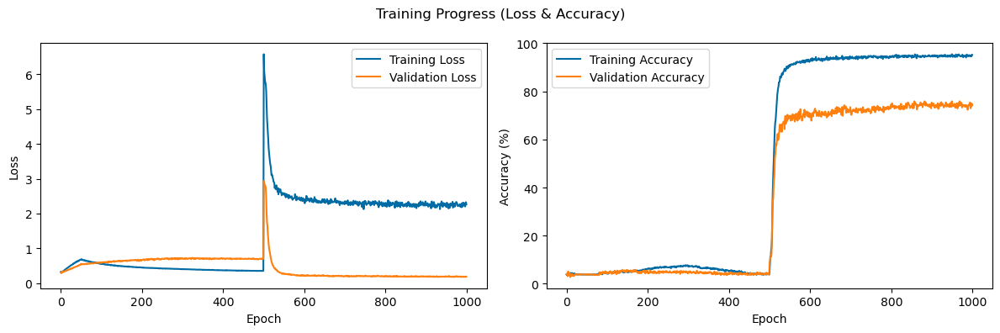

In [61]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.style.use('tableau-colorblind10')

# Plot training & validation loss
plt.subplot(1, 2, 1)
plt.plot(history["train_loss"], label="Training Loss")
plt.plot(history["val_loss"], label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# Plot training & validation accuracy
plt.subplot(1, 2, 2)
plt.plot([v * 100 for v in history["train_acc"]], label="Training Accuracy")
plt.plot([v * 100 for v in history["val_acc"]], label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.legend()

plt.suptitle("Training Progress (Loss & Accuracy)")
plt.tight_layout()
plt.show()

In [65]:
def evaluate_on_loader(test_loader, name="test", x_stats=None):
    ddpm.eval()
    diffe.eval()
    eegnet_model.eval()
    labels = np.arange(0, 26)
    Y, Y_hat = [], []
    with torch.no_grad():
        for x, y, sid in test_loader:
            x, y = x.to(device), y.type(torch.LongTensor).to(device)
            sid = sid.to(device)
           
            # x - local normalization
            x = torch.stack([
                (x[i] - x_stats[int(sid[i].item())][0].squeeze(0)) /
                x_stats[int(sid[i].item())][1].squeeze(0)
                for i in range(x.size(0))
            ])
           
            #x_hat, down, up, noise, t = ddpm(x)

            # Align the temporal dimension of x_hat and x
            #x_hat, x = safe_align_1d(x_hat, x)

            #ddpm_out = x_hat, down, up, t
            #ddpm_out = x, down, up, t
            #decoder_out, fc_out, z = diffe(x_hat, ddpm_out)

            outputs = config['eeg_in_original'] * eegnet_model(x) #+\
                      #config['eeg_in_ddpm'] * eegnet_model(x_hat) +\
                      #config['eeg_in_CAE'] * eegnet_model(decoder_out)

            #encoder_out = diffe.encoder(x)
            #y_hat = diffe.fc(encoder_out[1])
            y_hat = F.softmax(outputs, dim=1)

            Y.append(y.detach().cpu())
            Y_hat.append(y_hat.detach().cpu())

    Y = torch.cat(Y, dim=0).numpy()
    Y_hat = torch.cat(Y_hat, dim=0).numpy()

    accuracy = top_k_accuracy_score(Y, Y_hat, k=1, labels=labels)
    print(f" {name} Accuracy: {accuracy:.2%}")
    return accuracy

In [68]:
def evaluate_on_loader_test2(test_loader, name="test2", num_subjects=2, num_sessions=6):
    ddpm.eval()
    diffe.eval()
    eegnet_model.eval()
    labels = np.arange(0, 26)
    Y, Y_hat = [], []
    with torch.no_grad():
        all_x, all_y = [], []
        for x, y, _ in test_loader:
            all_x.append(x)
            all_y.append(y)
        all_x = torch.cat(all_x, dim=0).to(device)
        all_y = torch.cat(all_y, dim=0).to(device)

        samples_per_subject = num_sessions * 26
        for i in range(num_subjects):
            start = i * samples_per_subject
            end = (i + 1) * samples_per_subject
            x_sub = all_x[start:end]       # [156, C, T]
            y_sub = all_y[start:end]

            x_mean = x_sub[:104].mean(dim=0, keepdim=True)  # first 4 sessions
            x_std = x_sub[:104].std(dim=0, keepdim=True) + 1e-6

            print(f"[Check] Subject {i+1}: x_mean shape {x_mean.shape}, x_std shape {x_std.shape}")

            x_sub = (x_sub - x_mean) / x_std

            #x_hat, down, up, noise, t = ddpm(x_sub)

            # Align the temporal dimension of x_hat and x
            #x_hat, x_sub = safe_align_1d(x_hat, x_sub)

            #ddpm_out = x_hat, down, up, t
            #ddpm_out = x, down, up, t
            #decoder_out, fc_out, z = diffe(x_hat, ddpm_out)

            outputs = config['eeg_in_original'] * eegnet_model(x_sub) #+\
                      #config['eeg_in_ddpm'] * eegnet_model(x_hat) +\
                      #config['eeg_in_CAE'] * eegnet_model(decoder_out)

            #encoder_out = diffe.encoder(x)
            #y_hat = diffe.fc(encoder_out[1])
            y_hat = F.softmax(outputs, dim=1)

            Y.append(y_sub.detach().cpu())
            Y_hat.append(y_hat.detach().cpu())

    Y = torch.cat(Y, dim=0).numpy()
    Y_hat = torch.cat(Y_hat, dim=0).numpy()
    accuracy = top_k_accuracy_score(Y, Y_hat, k=1, labels=labels)
    print(f" {name} Accuracy: {accuracy:.2%}")
    return accuracy


#Evaluate on test data

In [69]:
acc1 = evaluate_on_loader(test1_loader, name="Test1 (Seen Subject)", x_stats=x_stats)
acc2 = evaluate_on_loader_test2(test2_loader, name="Test2 (Unseen Subject)")

 Test1 (Seen Subject) Accuracy: 74.01%
[Check] Subject 1: x_mean shape torch.Size([1, 64, 250]), x_std shape torch.Size([1, 64, 250])
[Check] Subject 2: x_mean shape torch.Size([1, 64, 250]), x_std shape torch.Size([1, 64, 250])
 Test2 (Unseen Subject) Accuracy: 37.82%


In [35]:
if USE_WANDB:
    run.finish()

train_acc,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▄▇███████████████
train_loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄
valid_acc,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▅▇▇█▇████████████████
valid_loss,▃▅▇▇▇▇▇█████████████▆▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,0.95192
train_loss,2.26392
valid_acc,0.74242
valid_loss,0.18871


In [36]:
def visualize_signals_grid(original, masked, ddpm_out, decoder_out, sample_idxs, dataset_name, channel=0):
    """
    Creates a grid figure showing Original / Masked / DDPM / Decoder outputs per sample
    """
    import matplotlib.pyplot as plt

    num_samples = len(sample_idxs)
    fig, axes = plt.subplots(num_samples, 4, figsize=(20, 4 * num_samples), squeeze=False)

    for i, sample_idx in enumerate(sample_idxs):
        orig_np = original[sample_idx, channel].detach().cpu().numpy()
        masked_np = masked[sample_idx, channel].detach().cpu().numpy()
        ddpm_np = ddpm_out[sample_idx, channel].detach().cpu().numpy()
        decoder_np = decoder_out[sample_idx, channel].detach().cpu().numpy()

        axes[i, 0].plot(orig_np, color='blue')
        axes[i, 0].set_title(f"{dataset_name} Sample {sample_idx} – Original")

        axes[i, 1].plot(masked_np, color='orange')
        axes[i, 1].set_title("Masked")

        axes[i, 2].plot(ddpm_np, color='green')
        axes[i, 2].set_title("DDPM Output")

        axes[i, 3].plot(decoder_np, color='red')
        axes[i, 3].set_title("Decoder Output")

        for j in range(4):
            axes[i, j].set_xlabel("Time")
            axes[i, j].set_ylabel("Amplitude")

    fig.suptitle(f"{dataset_name} EEG Signal Visualization", fontsize=18)
    fig.tight_layout()
    return fig

In [37]:
def visualize_sample_stacked(original, masked, ddpm_out, decoder_out, sample_idxs=[0], channel=0, dataset_name="Dataset"):
    import matplotlib.pyplot as plt

    for idx in sample_idxs:
        fig, axes = plt.subplots(4, 1, figsize=(15, 8), sharex=True)

        signals = [
            original[idx, channel].detach().cpu().numpy(),
            masked[idx, channel].detach().cpu().numpy(),
            ddpm_out[idx, channel].detach().cpu().numpy(),
            decoder_out[idx, channel].detach().cpu().numpy()
        ]
        titles = ["Original", "Masked", "DDPM Output", "Decoder Output"]
        colors = ["blue", "orange", "green", "red"]

        for i in range(4):
            axes[i].plot(signals[i], color=colors[i])
            axes[i].set_title(f"{dataset_name} Sample {idx} – {titles[i]}")
            axes[i].set_ylabel("Amplitude")

        axes[-1].set_xlabel("Time")
        fig.suptitle(f"{dataset_name} Sample {idx} – Channel {channel}", fontsize=16)
        fig.tight_layout()
        plt.show()


In [38]:
def visualize_sample_overlayed(original, masked, ddpm_out, decoder_out, sample_idxs=[0], channel=0, dataset_name="Dataset"):
    import matplotlib.pyplot as plt

    for idx in sample_idxs:
        fig, ax = plt.subplots(figsize=(15, 4))

        signals = [
            original[idx, channel].detach().cpu().numpy(),
            masked[idx, channel].detach().cpu().numpy(),
            ddpm_out[idx, channel].detach().cpu().numpy(),
            decoder_out[idx, channel].detach().cpu().numpy()
        ]
        labels = ["Original", "Masked", "DDPM Output", "Decoder Output"]
        colors = ["blue", "orange", "green", "red"]
        styles = ["solid", "dashed", "dashdot", "solid"]

        for signal, label, color, style in zip(signals, labels, colors, styles):
            ax.plot(signal, label=label, color=color, linestyle=style)

        ax.set_title(f"{dataset_name} Sample {idx} – Overlaid Signals (Channel {channel})")
        ax.set_xlabel("Time")
        ax.set_ylabel("Amplitude")
        ax.legend()
        plt.tight_layout()
        plt.show()


In [39]:
def visualize_all_datasets(loaders_dict, model_ddpm, model_diffe, device, sample_idxs=[0, 1, 2], channel=0):
    model_ddpm.eval()
    model_diffe.eval()

    for name, loader in loaders_dict.items():
        with torch.no_grad():
            for x, _,_ in loader:
                x = x.to(device)

                # Forward through DDPM
                x_hat, down, up, noise, t = model_ddpm(x)
                ddpm_out = (x_hat, down, up, t)
                x_masked = x + noise

                # Align time dimension
                min_len = min(x.shape[2], x_hat.shape[2], noise.shape[2])
                x = x[..., :min_len]
                x_hat = x_hat[..., :min_len]
                x_masked = x_masked[..., :min_len]

                # Forward through DiffE
                decoder_out, _, _ = model_diffe(x, ddpm_out)
                decoder_out = decoder_out[..., :min_len]

                # Visualize
                fig = visualize_signals_grid(x, x_masked, x_hat, decoder_out, sample_idxs, dataset_name=name, channel=channel)
                plt.show()

                visualize_sample_stacked(
                    original=x,
                    masked=x_masked,
                    ddpm_out=x_hat,
                    decoder_out=decoder_out,
                    sample_idxs=sample_idxs,
                    channel=channel,
                    dataset_name=name
                )

                visualize_sample_overlayed(
                    original=x,
                    masked=x_masked,
                    ddpm_out=x_hat,
                    decoder_out=decoder_out,
                    sample_idxs=sample_idxs,
                    channel=channel,
                    dataset_name=name
                )


                break


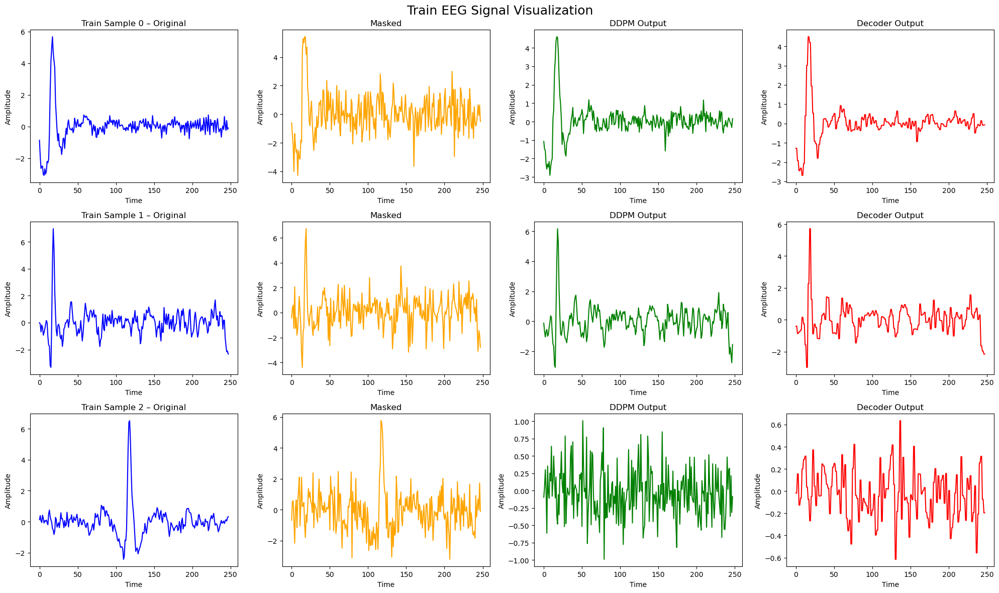

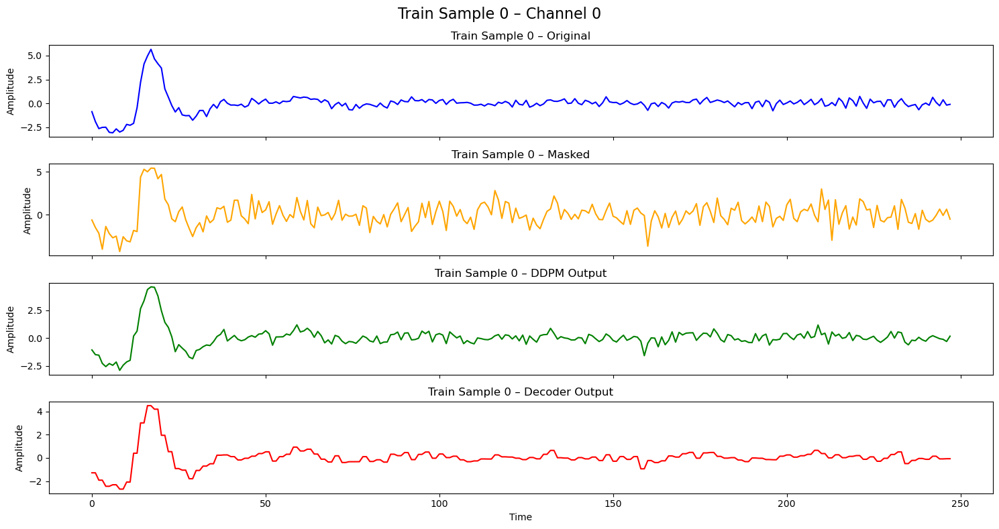

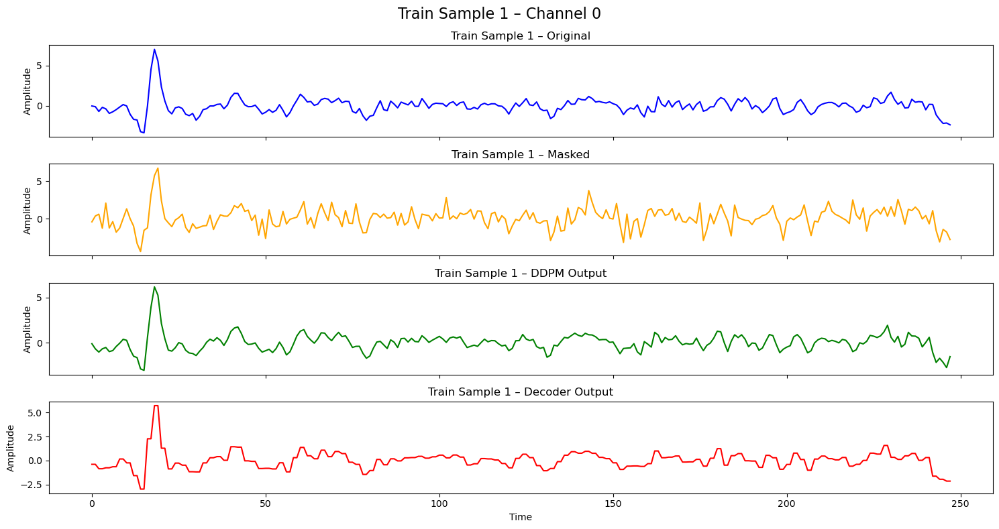

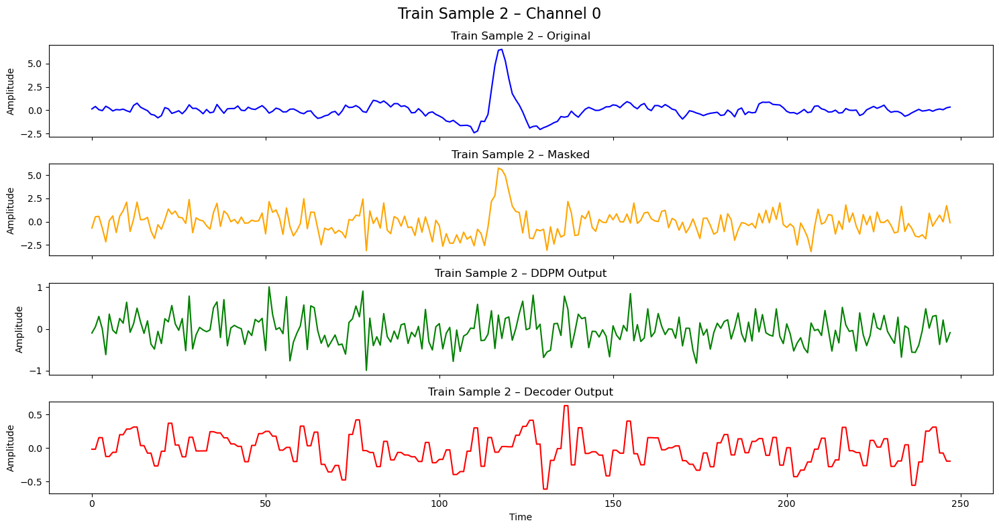

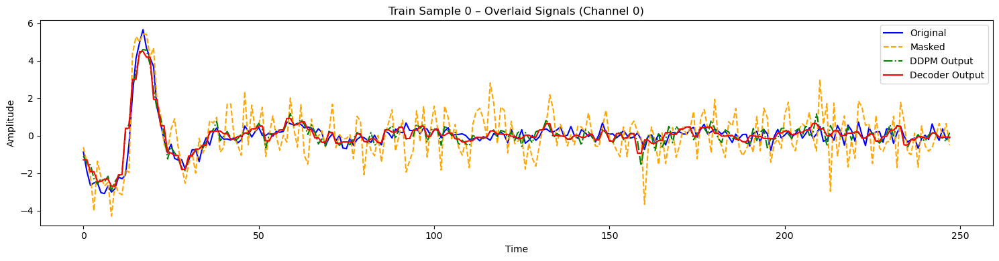

...

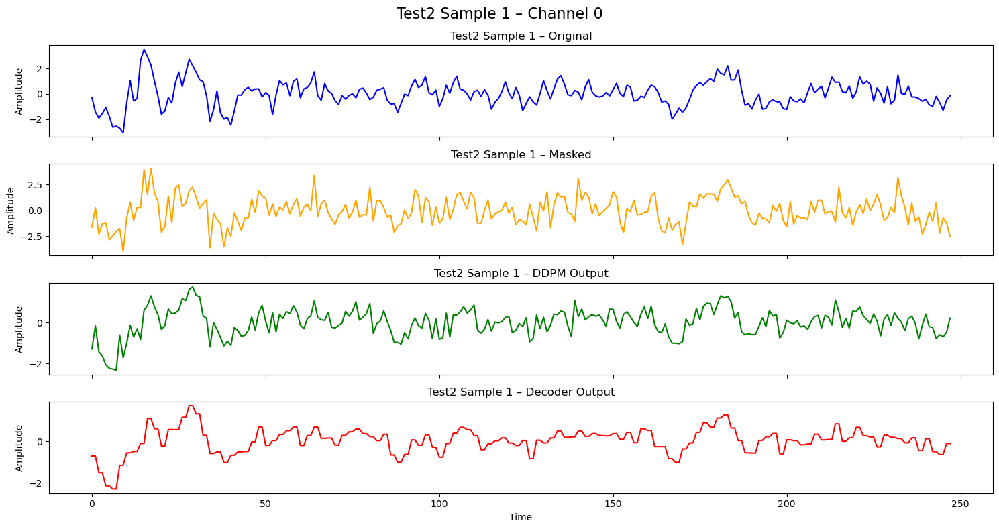

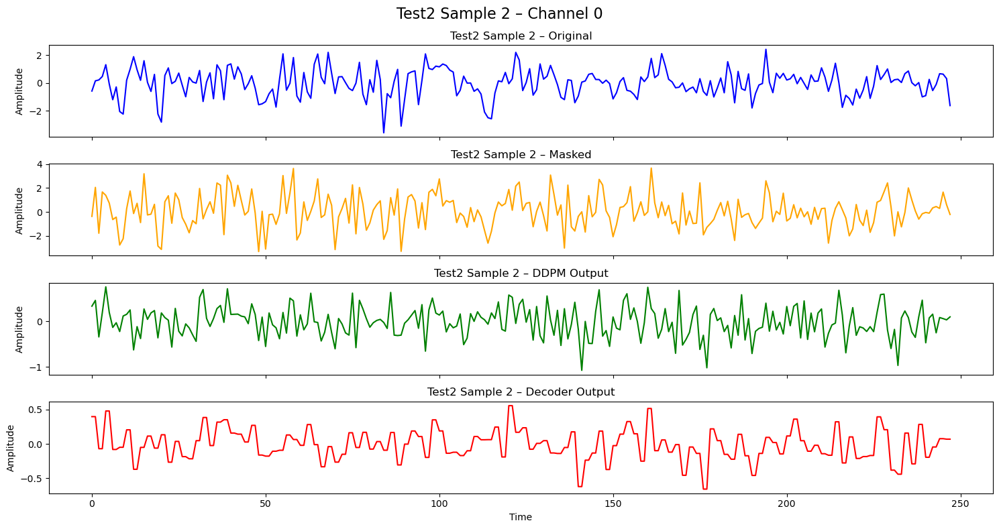

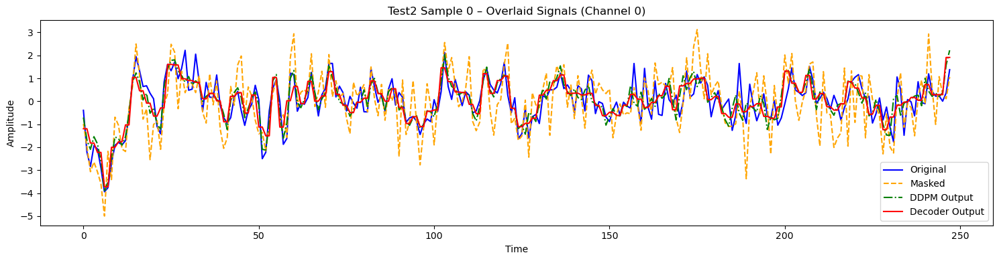

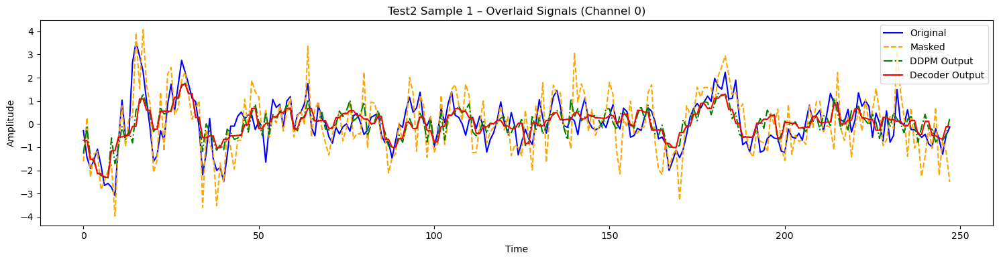

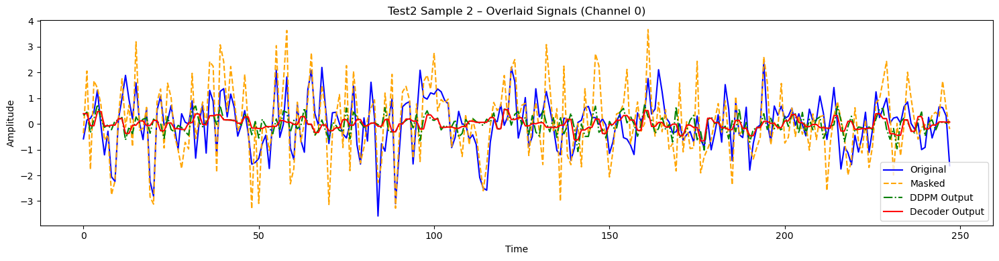

In [40]:
loaders = {
    "Train": train_loader,
    "Validation": val_loader,
    "Test1": test1_loader,
    "Test2": test2_loader,
}

visualize_all_datasets(loaders, ddpm, diffe, device, sample_idxs=[0, 1, 2], channel=0)

# t-SNE

In [41]:
#PCA
from sklearn.decomposition import PCA

def pca_and_plot(X, color, title, color_type='label'):
    X_pca = PCA(n_components=2).fit_transform(X)
    classes = sorted(np.unique(color))
    cmap = cm.get_cmap('tab20', len(classes))
    plt.figure(figsize=(12, 9))
    for i, c in enumerate(classes):
        idx = (color == c)
        plt.scatter(X_pca[idx, 0], X_pca[idx, 1], label=f"{color_type} {c}", color=cmap(i / len(classes)), s=10)
    plt.title(f"{title} (PCA by {color_type})")
    plt.legend(markerscale=2, fontsize="x-small", bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
    plt.tight_layout()
    plt.show()


>>> First 30 labels from train dataloader (label y):
[17, 17, 11, 22, 8, 11, 16, 17, 19, 12, 20, 23, 13, 1, 6, 9, 9, 15, 23, 4, 17, 21, 9, 19, 16, 20, 4, 12, 23, 12]
>>> First 30 labels used for t-SNE coloring (train):
[17, 17, 11, 22, 8, 11, 16, 17, 19, 12, 20, 23, 13, 1, 6, 9, 9, 15, 23, 4, 17, 21, 9, 19, 16, 20, 4, 12, 23, 12]
>>> First 30 labels from label_all_train:
[17, 17, 11, 22, 8, 11, 16, 17, 19, 12, 20, 23, 13, 1, 6, 9, 9, 15, 23, 4, 17, 21, 9, 19, 16, 20, 4, 12, 23, 12]
Running t-SNE on 3432 samples...


C:\Users\shaoy\anaconda3\envs\pytorch_env_p11\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\shaoy\anaconda3\envs\pytorch_env_p11\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\shaoy\anaconda3\envs\pytorch_env_p11\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\shaoy\anaconda3\envs\pytorch_env_p11\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\shaoy\anaconda3\envs\

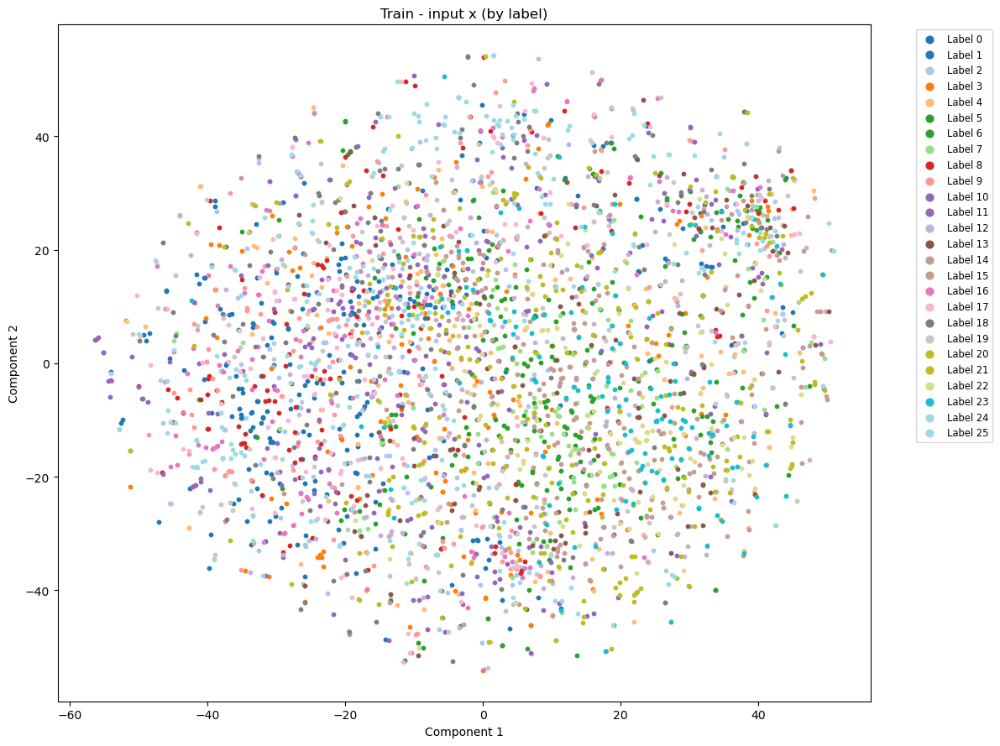

C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\2565234762.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


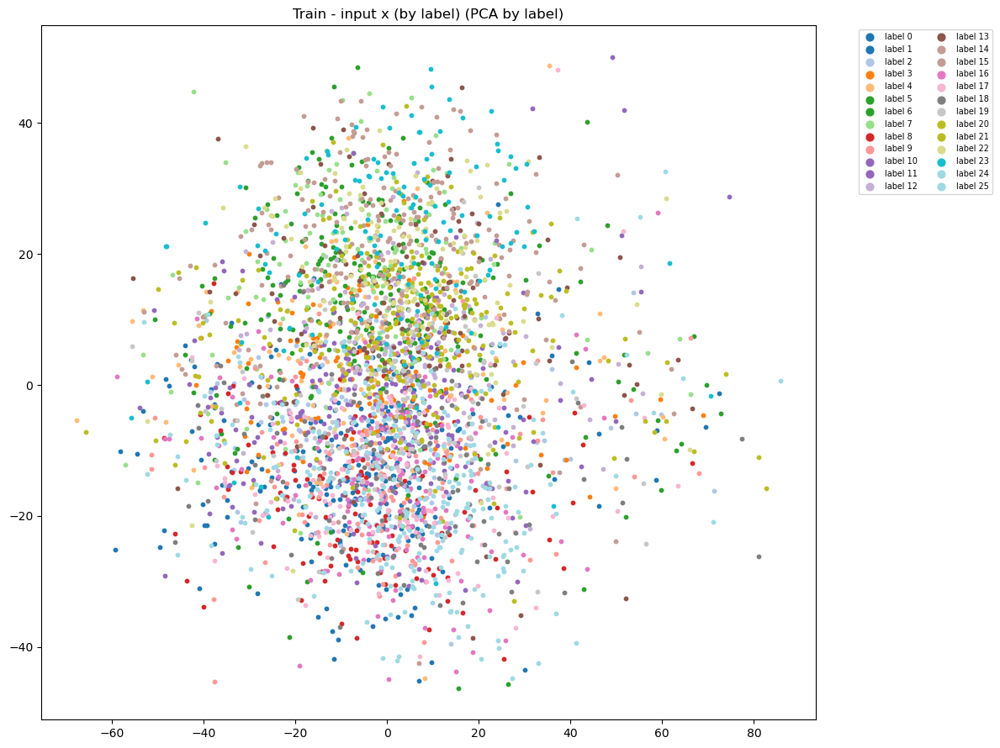

Running t-SNE on 3432 samples...


C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\973357963.py:56: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_classes)


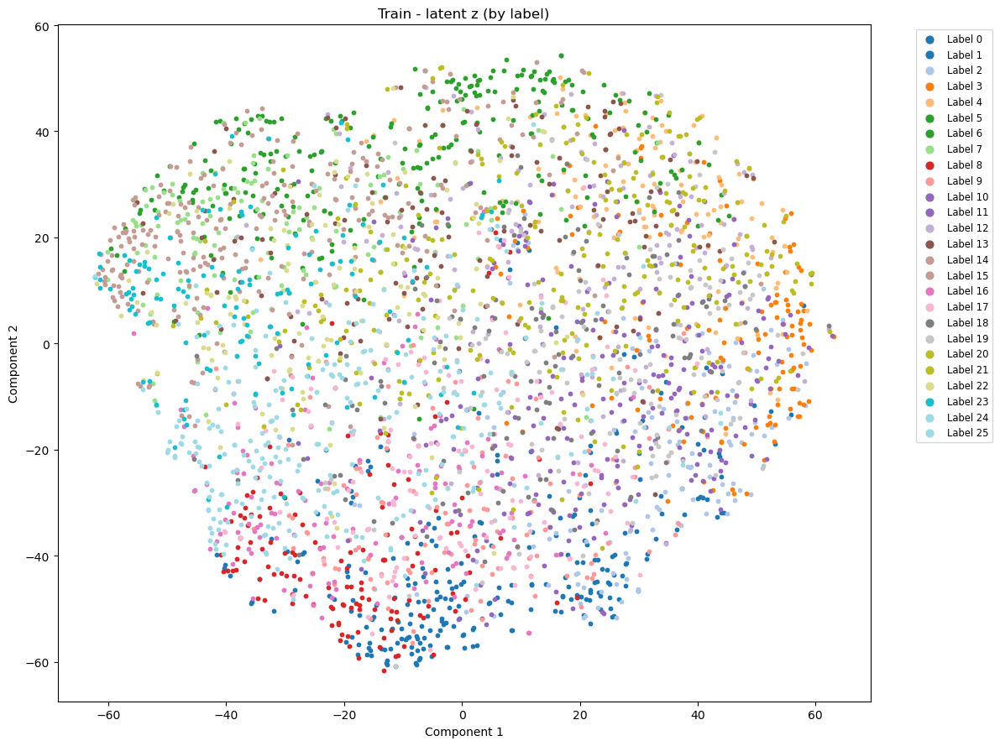

C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\2565234762.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


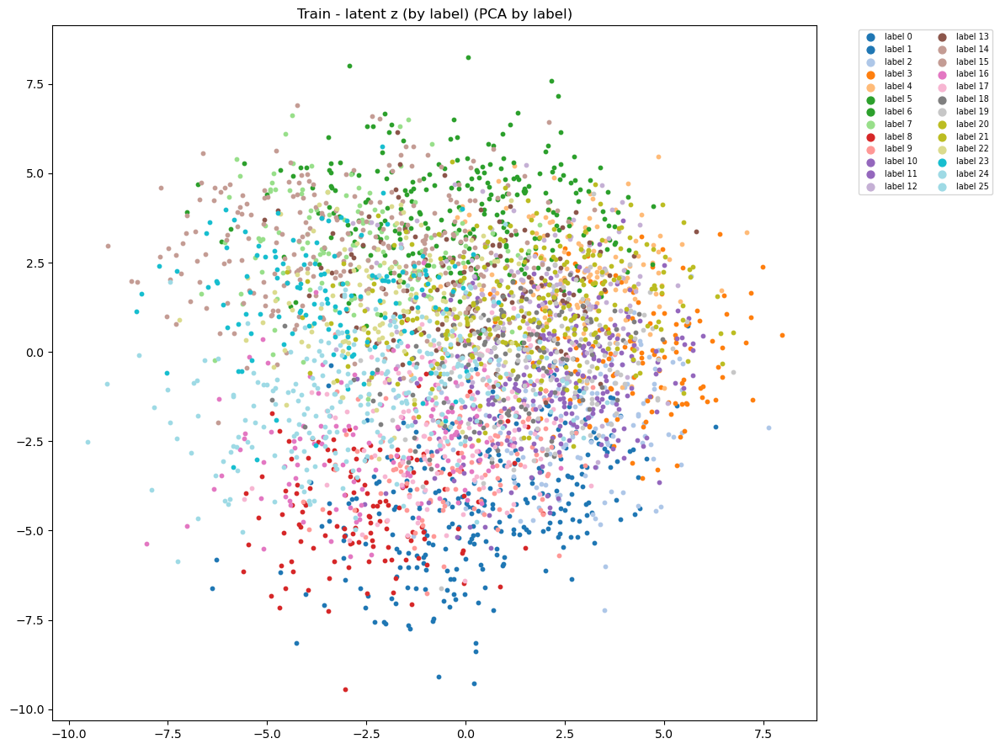

Running t-SNE on 3432 samples...


C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\973357963.py:56: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_classes)


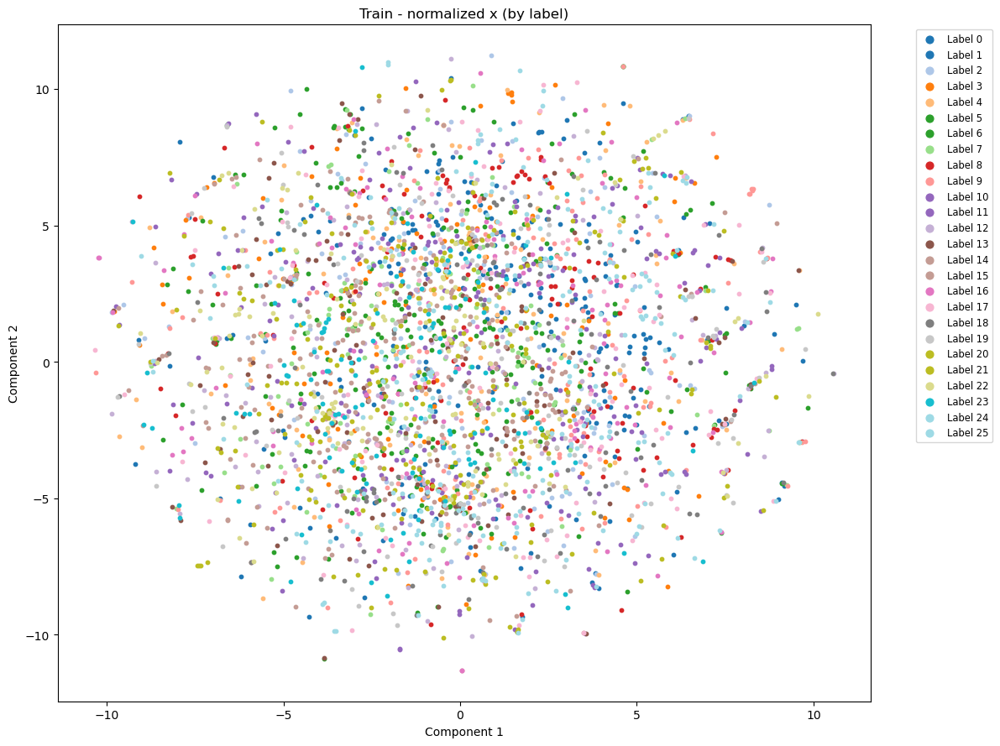

C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\2565234762.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


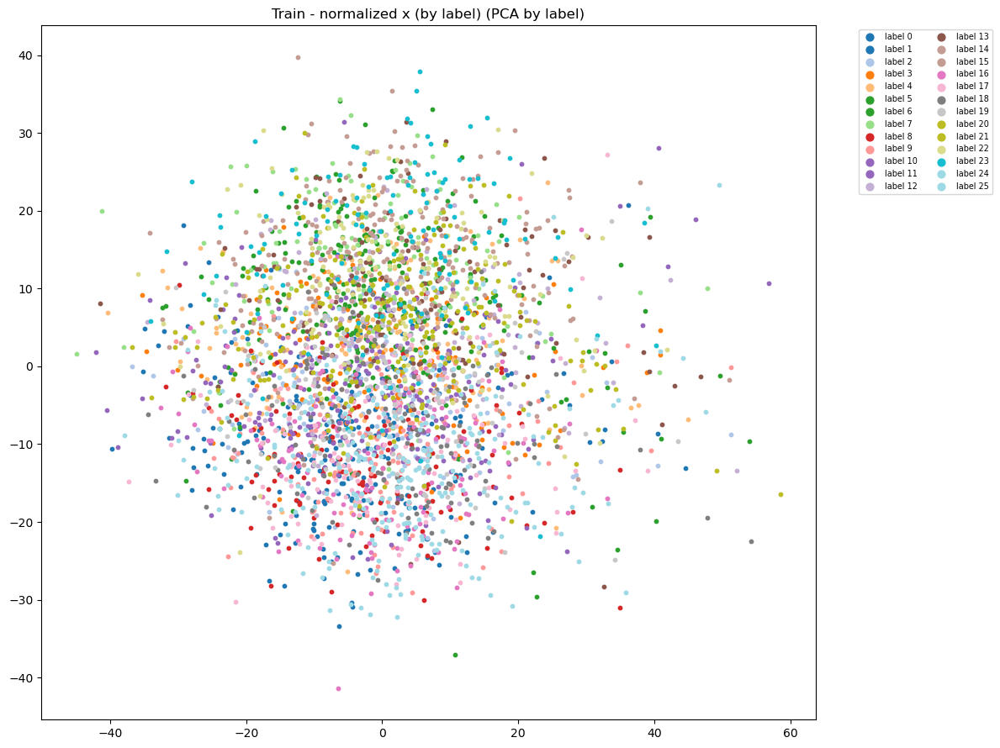

In [42]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm

#train by label
train_iter = iter(train_loader)

x0_train, y0_train, sid0_train = next(train_iter)
print(">>> First 30 labels from train dataloader (label y):")
print(y0_train[:30].tolist())

_, z0_train = encoder(x0_train.to(device))
z_list_train = [z0_train.detach().cpu()]
x_list_train = [x0_train.view(x0_train.size(0), -1).detach().cpu()]
label_list_train = [y0_train.cpu()]
first_30_label_train = y0_train[:30].tolist()

sid_list_train = [sid0_train.cpu()]

with torch.no_grad():
    for x, y, sid in train_iter:
        x = x.to(device)
        _, z = encoder(x)
        z_list_train.append(z.detach().cpu())
        x_list_train.append(x.view(x.size(0), -1).detach().cpu())
        label_list_train.append(y.cpu())
        sid_list_train.append(sid.cpu())

x_all_train_tensor = torch.cat(x_list_train, dim=0)
sid_all_train_tensor = torch.cat(sid_list_train, dim=0)

# Normalize x using subject-wise x_stats
x_all_train_normed = torch.stack([
    (x_all_train_tensor[i] - x_stats[int(sid_all_train_tensor[i])][0].view(-1).cpu()) /
    x_stats[int(sid_all_train_tensor[i])][1].view(-1).cpu()
    for i in range(x_all_train_tensor.size(0))
])
x_all_train_normed = x_all_train_normed.numpy()

z_all_train = torch.cat(z_list_train, dim=0).numpy()
x_all_train = torch.cat(x_list_train, dim=0).numpy()
label_all_train = torch.cat(label_list_train, dim=0).numpy()
sid_all_train = torch.cat(sid_list_train, dim=0).numpy()

print(">>> First 30 labels used for t-SNE coloring (train):")
print(first_30_label_train)
print(">>> First 30 labels from label_all_train:")
print(label_all_train[:30].tolist())

def tsne_visualize_by_label(X, labels, title="t-SNE visualization by label"):
    print(f"Running t-SNE on {len(labels)} samples...")
    X_emb = TSNE(n_components=2, perplexity=30, learning_rate=200).fit_transform(X)

    unique_labels = sorted(np.unique(labels))
    n_classes = len(unique_labels)
    cmap = cm.get_cmap('tab20', n_classes)

    plt.figure(figsize=(12, 9))
    for i, lab in enumerate(unique_labels):
        idx = (labels == lab)
        plt.scatter(X_emb[idx, 0], X_emb[idx, 1], label=f"Label {lab}", color=cmap(i / n_classes), s=10)

    plt.legend(markerscale=2, fontsize="small", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.title(title)
    plt.xlabel("Component 1")
    plt.ylabel("Component 2")
    plt.tight_layout()
    plt.show()

tsne_visualize_by_label(x_all_train, label_all_train, title="Train - input x (by label)")
pca_and_plot(x_all_train, label_all_train, f"Train - input x (by label)", color_type='label')
tsne_visualize_by_label(z_all_train, label_all_train, title="Train - latent z (by label)")
pca_and_plot(z_all_train, label_all_train, f"Train - latent z (by label)", color_type='label')

tsne_visualize_by_label(x_all_train_normed, label_all_train, title="Train - normalized x (by label)")
pca_and_plot(x_all_train_normed, label_all_train, f"Train - normalized x (by label)", color_type='label')

# perm_train = np.random.permutation(len(label_all_train))
# tsne_visualize_by_label(z_all_train, label_all_train[perm_train], title="Train - Shuffled Label Visualization")
# pca_and_plot(z_all_train, label_all_train[perm_train], f"Train - Shuffled Label Visualization", color_type='label')


In [43]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans
from sklearn.metrics import (
    accuracy_score,
    adjusted_rand_score,
    normalized_mutual_info_score,
    silhouette_score
)
results = {}

clf = LogisticRegression(max_iter=1000)
clf.fit(z_all_train, label_all_train)
acc = accuracy_score(label_all_train, clf.predict(z_all_train))
results['linear_probe_label_acc'] = acc

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(z_all_train, label_all_train)
knn_acc = accuracy_score(label_all_train, knn.predict(z_all_train))
results['knn_label_acc'] = knn_acc

kmeans_label = KMeans(n_clusters=len(np.unique(label_all_train)), random_state=0).fit(z_all_train)
ari_label = adjusted_rand_score(label_all_train, kmeans_label.labels_)
nmi_label = normalized_mutual_info_score(label_all_train, kmeans_label.labels_)
results['ARI_label'] = ari_label
results['NMI_label'] = nmi_label

sil = silhouette_score(z_all_train, label_all_train)
results['silhouette_z'] = sil

for k, v in results.items():
    print(f"{k}: {v:.4f}")


C:\Users\shaoy\anaconda3\envs\pytorch_env_p11\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=14.
  warnings.warn(


linear_probe_label_acc: 0.8269
knn_label_acc: 0.4653
ARI_label: 0.1080
NMI_label: 0.3308
silhouette_z: -0.0369


>>> First 30 labels from val dataloader (label y):
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 0, 1, 2, 3]
>>> First 30 labels used for t-SNE coloring (val):
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 0, 1, 2, 3]
>>> First 30 labels from label_all_val:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 0, 1, 2, 3]
Running t-SNE on 858 samples...


C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\973357963.py:56: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_classes)


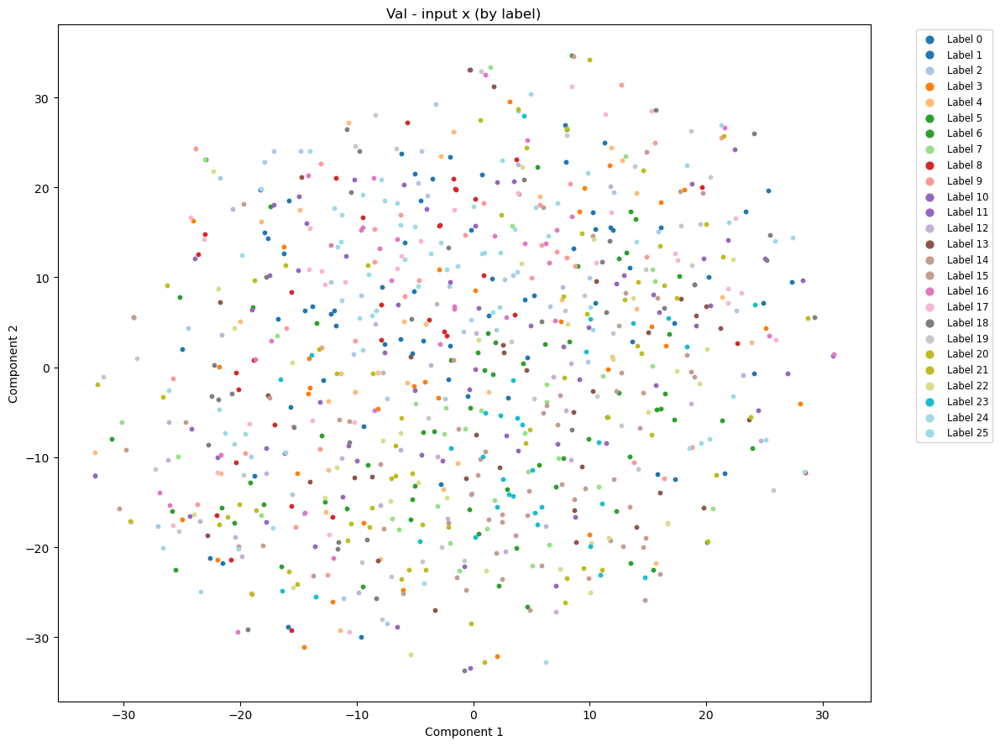

C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\2565234762.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


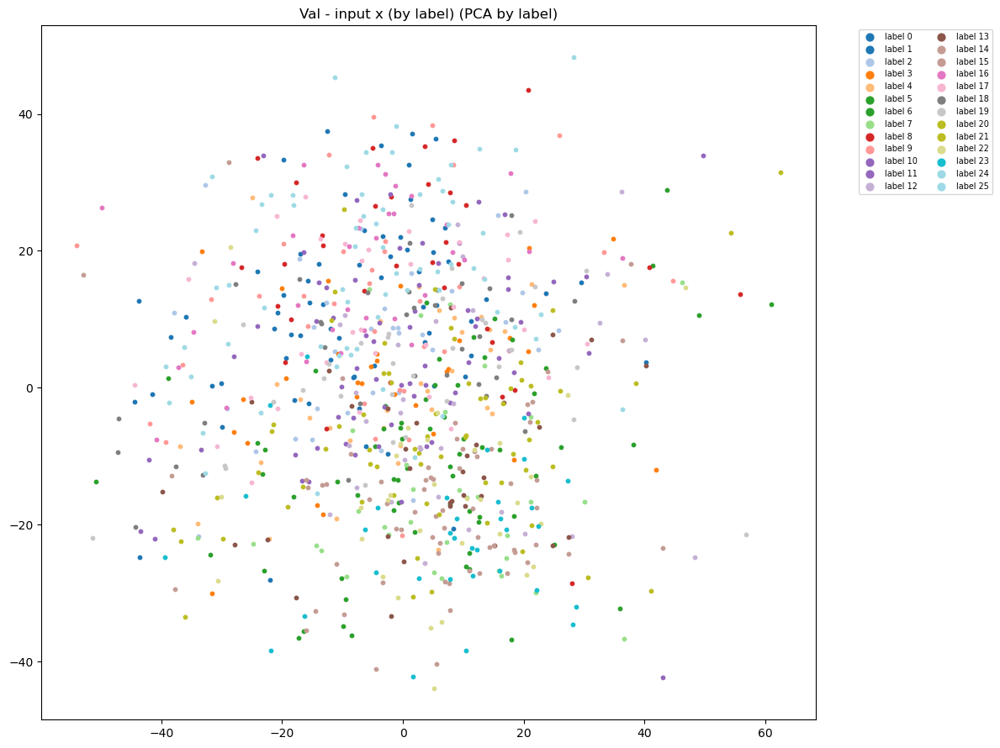

Running t-SNE on 858 samples...


C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\973357963.py:56: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_classes)


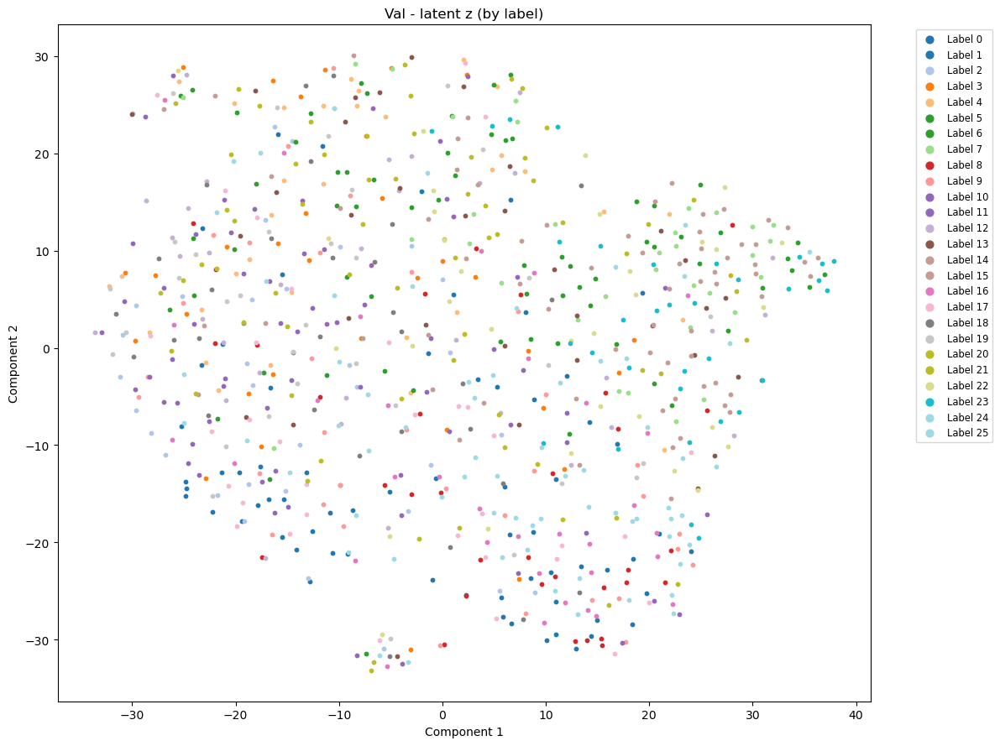

C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\2565234762.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


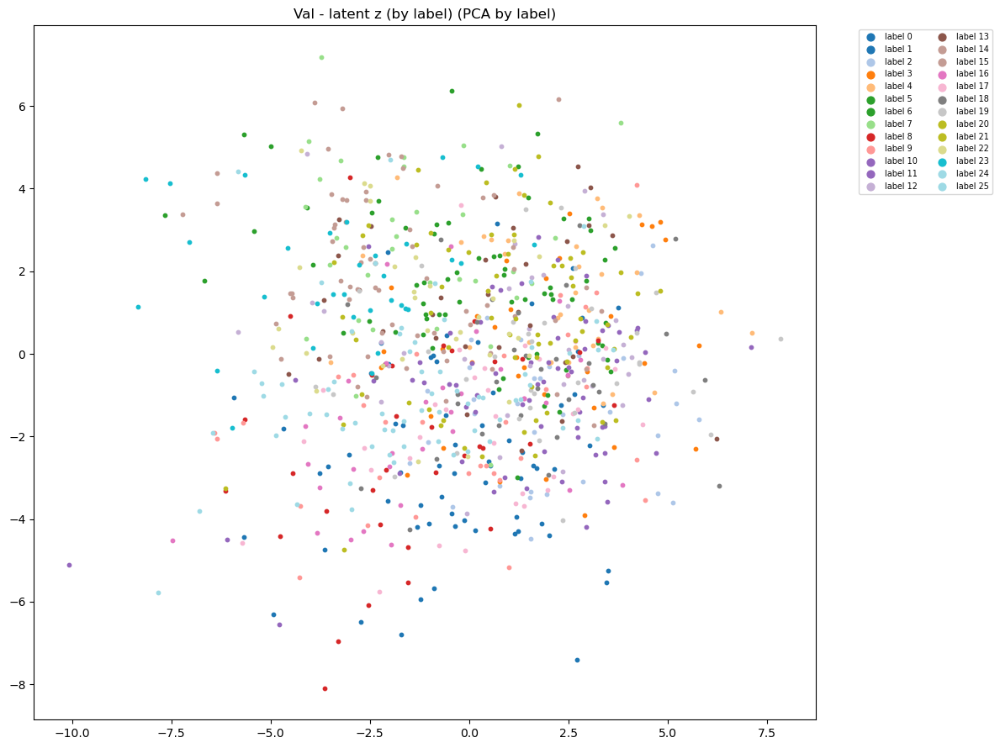

Running t-SNE on 858 samples...


C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\973357963.py:56: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_classes)


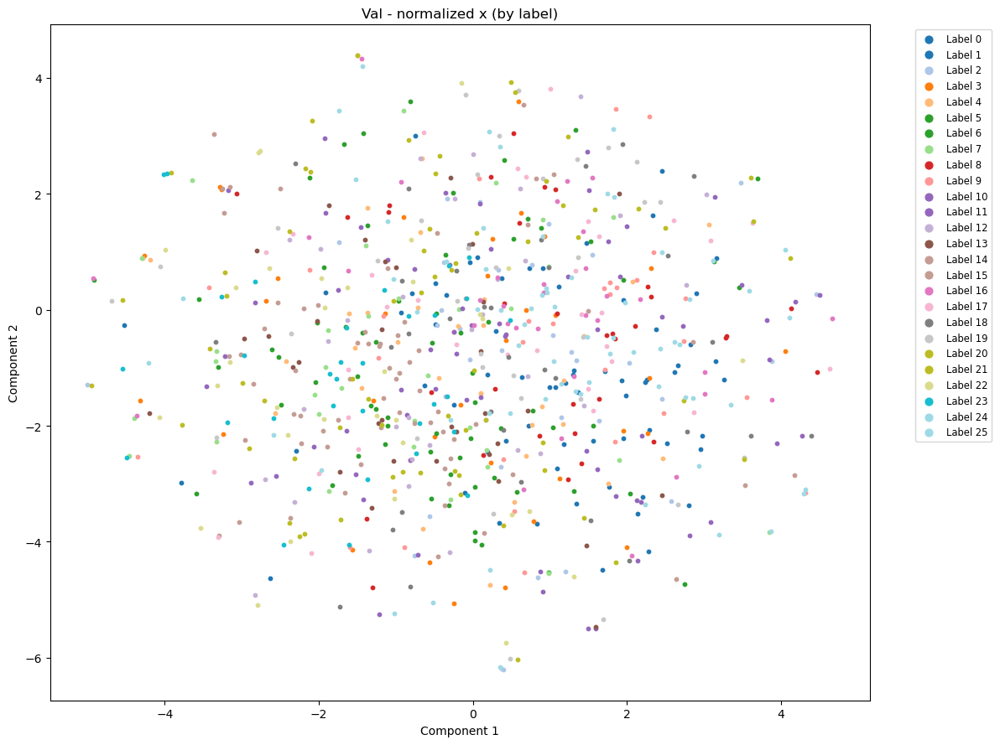

C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\2565234762.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


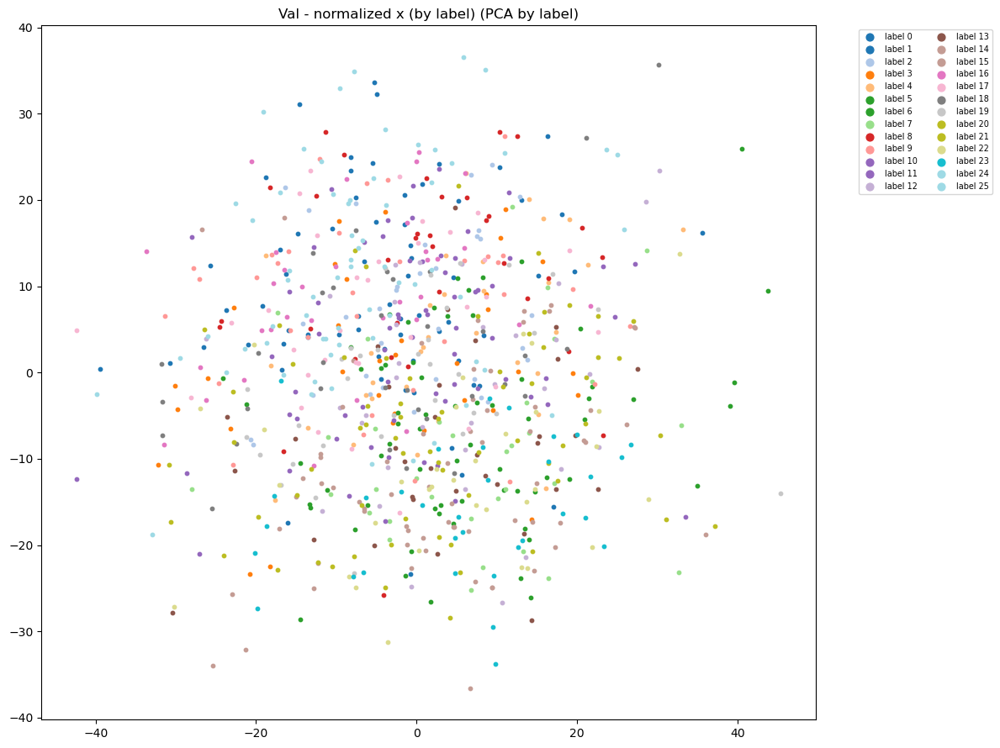

In [44]:
#val by label (shuffle=F)
val_iter = iter(val_loader)

x0_val, y0_val, sid0_val = next(val_iter)
print(">>> First 30 labels from val dataloader (label y):")
print(y0_val[:30].tolist())

_, z0_val = encoder(x0_val.to(device))
z_list_val = [z0_val.detach().cpu()]
x_list_val = [x0_val.view(x0_val.size(0), -1).detach().cpu()]
label_list_val = [y0_val.cpu()]
first_30_label_val = y0_val[:30].tolist()

sid_list_val = [sid0_val.cpu()]

with torch.no_grad():
    for x, y, sid in val_iter:
        x = x.to(device)
        _, z = encoder(x)
        z_list_val.append(z.detach().cpu())
        x_list_val.append(x.view(x.size(0), -1).detach().cpu())
        label_list_val.append(y.cpu())
        sid_list_val.append(sid.cpu())

x_all_val_tensor = torch.cat(x_list_val, dim=0)
sid_all_val_tensor = torch.cat(sid_list_val, dim=0)

x_all_val_normed = torch.stack([
    (x_all_val_tensor[i] - x_stats[int(sid_all_val_tensor[i])][0].view(-1).cpu()) /
    x_stats[int(sid_all_val_tensor[i])][1].view(-1).cpu()
    for i in range(x_all_val_tensor.size(0))
])
x_all_val_normed = x_all_val_normed.numpy()

z_all_val = torch.cat(z_list_val, dim=0).numpy()
x_all_val = torch.cat(x_list_val, dim=0).numpy()
label_all_val = torch.cat(label_list_val, dim=0).numpy()
sid_all_val = torch.cat(sid_list_val, dim=0).numpy()  #

print(">>> First 30 labels used for t-SNE coloring (val):")
print(first_30_label_val)
print(">>> First 30 labels from label_all_val:")
print(label_all_val[:30].tolist())

tsne_visualize_by_label(x_all_val, label_all_val, title="Val - input x (by label)")
pca_and_plot(x_all_val, label_all_val, f"Val - input x (by label)", color_type='label')

tsne_visualize_by_label(z_all_val, label_all_val, title="Val - latent z (by label)")
pca_and_plot(z_all_val, label_all_val, f"Val - latent z (by label)", color_type='label')

tsne_visualize_by_label(x_all_val_normed, label_all_val, title="Val - normalized x (by label)")
pca_and_plot(x_all_val_normed, label_all_val, f"Val - normalized x (by label)", color_type='label')

In [45]:
results = {}

clf = LogisticRegression(max_iter=1000)
clf.fit(z_all_val, label_all_val)
acc = accuracy_score(label_all_val, clf.predict(z_all_val))
results['linear_probe_label_acc'] = acc

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(z_all_val, label_all_val)
knn_acc = accuracy_score(label_all_val, knn.predict(z_all_val))
results['knn_label_acc'] = knn_acc

kmeans_label = KMeans(n_clusters=len(np.unique(label_all_val)), random_state=0).fit(z_all_val)
ari_label = adjusted_rand_score(label_all_val, kmeans_label.labels_)
nmi_label = normalized_mutual_info_score(label_all_val, kmeans_label.labels_)
results['ARI_label'] = ari_label
results['NMI_label'] = nmi_label

sil = silhouette_score(z_all_val, label_all_val)
results['silhouette_z'] = sil

for k, v in results.items():
    print(f"{k}: {v:.4f}")


C:\Users\shaoy\anaconda3\envs\pytorch_env_p11\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


linear_probe_label_acc: 0.8939
knn_label_acc: 0.2727
ARI_label: 0.0263
NMI_label: 0.2081
silhouette_z: -0.0829


>>> First 30 labels from val dataloader (label y):
[23, 25, 0, 18, 4, 21, 15, 14, 21, 16, 23, 2, 19, 13, 11, 10, 17, 16, 11, 0, 8, 2, 24, 9, 14, 22, 20, 24, 15, 18]
>>> First 30 labels used for t-SNE coloring (val):
[23, 25, 0, 18, 4, 21, 15, 14, 21, 16, 23, 2, 19, 13, 11, 10, 17, 16, 11, 0, 8, 2, 24, 9, 14, 22, 20, 24, 15, 18]
>>> First 30 labels from label_all_val:
[23, 25, 0, 18, 4, 21, 15, 14, 21, 16, 23, 2, 19, 13, 11, 10, 17, 16, 11, 0, 8, 2, 24, 9, 14, 22, 20, 24, 15, 18]
Running t-SNE on 858 samples...


C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\973357963.py:56: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_classes)


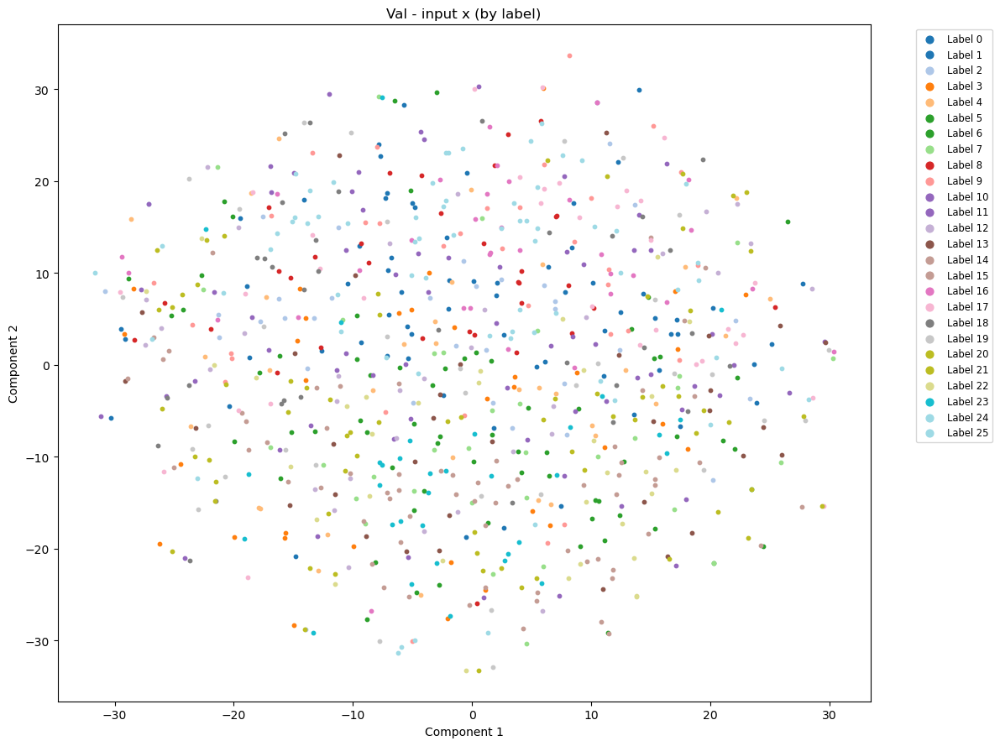

C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\2565234762.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


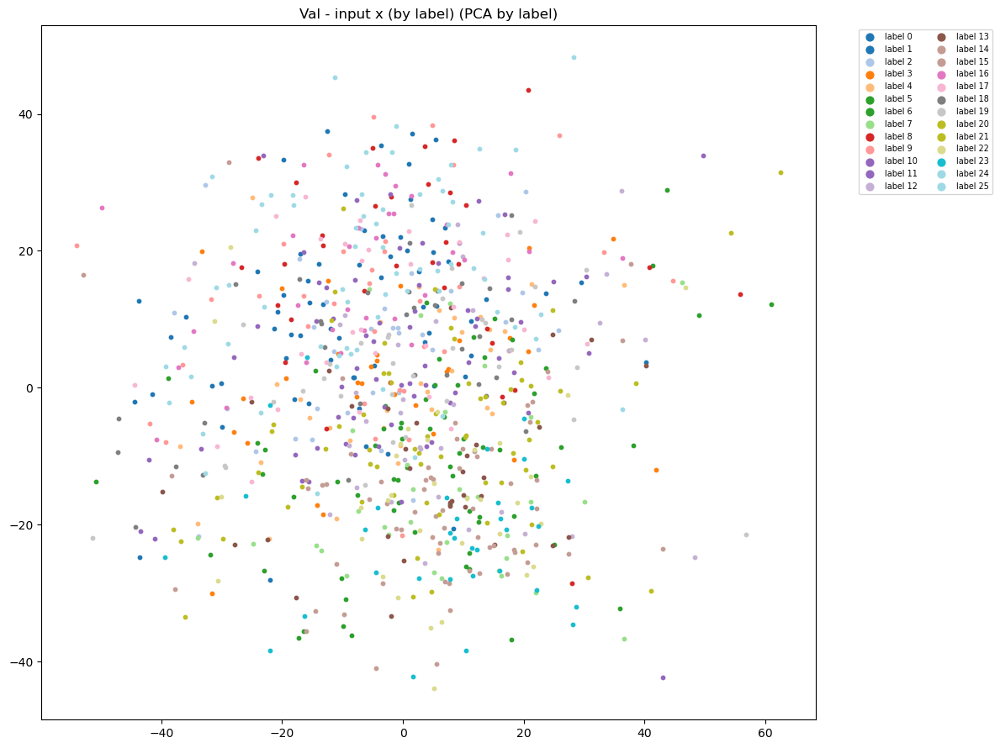

Running t-SNE on 858 samples...


C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\973357963.py:56: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_classes)


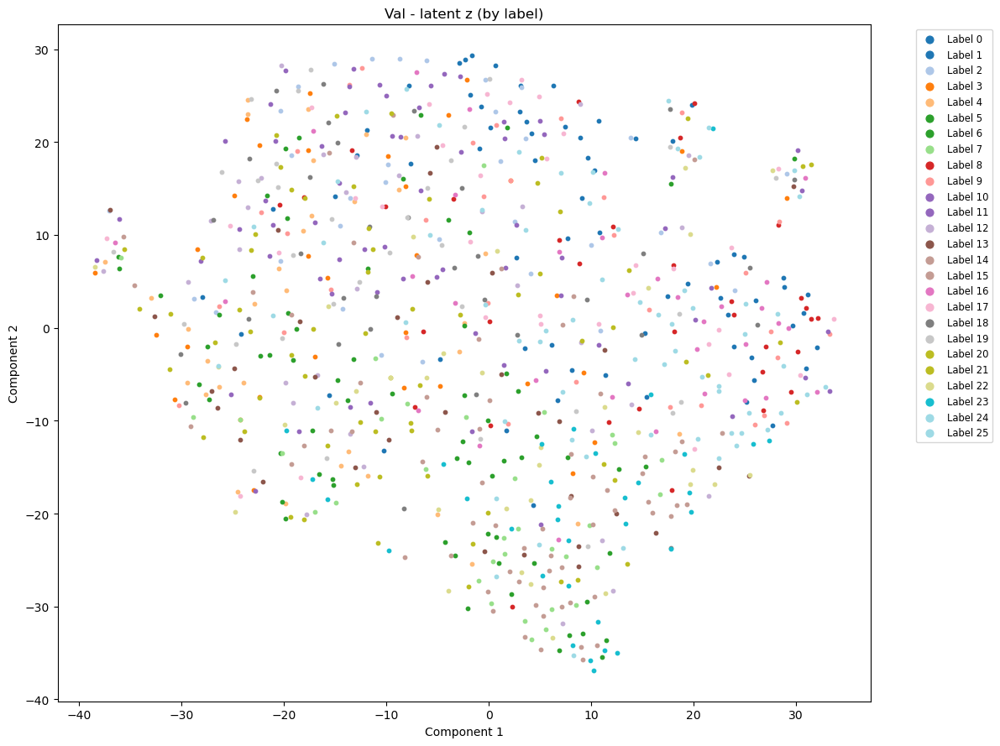

C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\2565234762.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


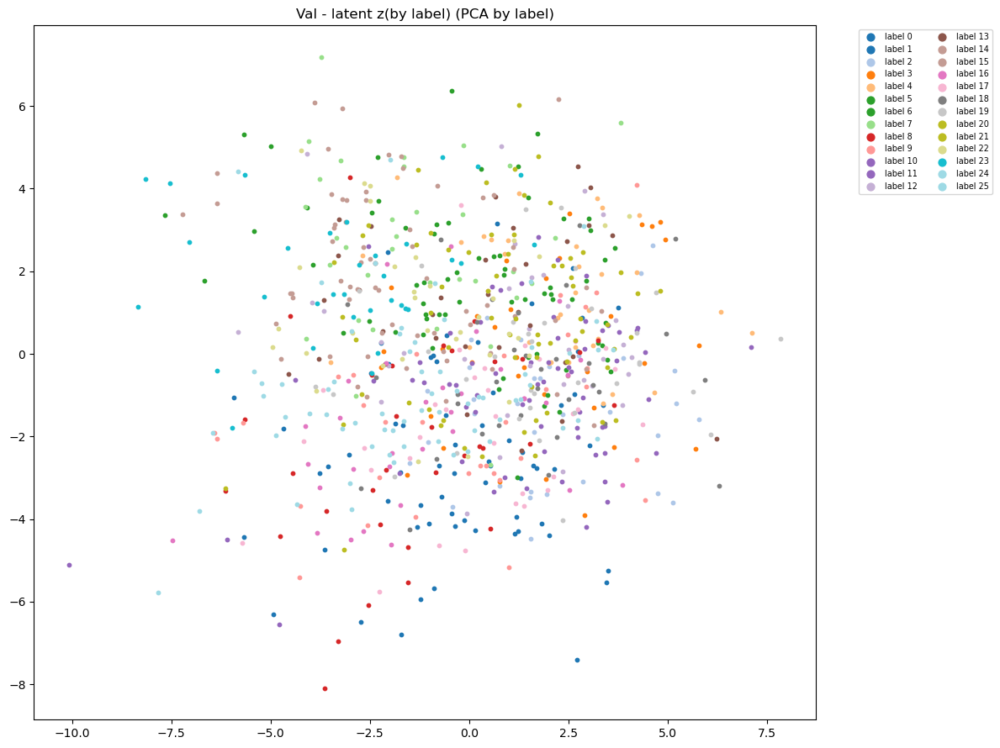

Running t-SNE on 858 samples...


C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\973357963.py:56: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_classes)


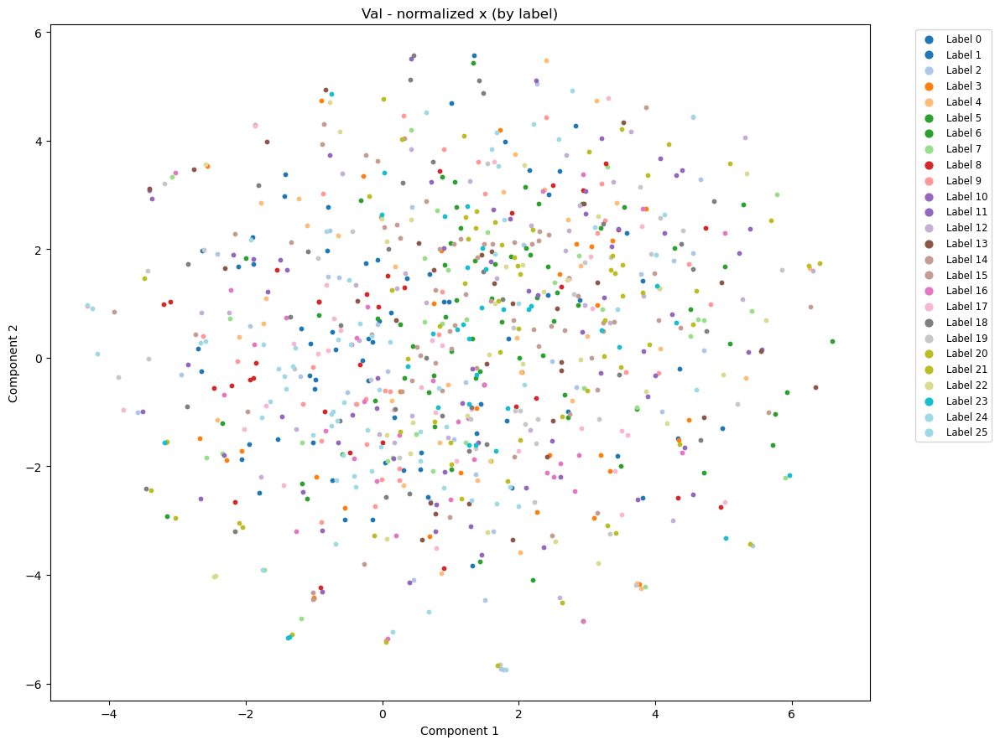

C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\2565234762.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


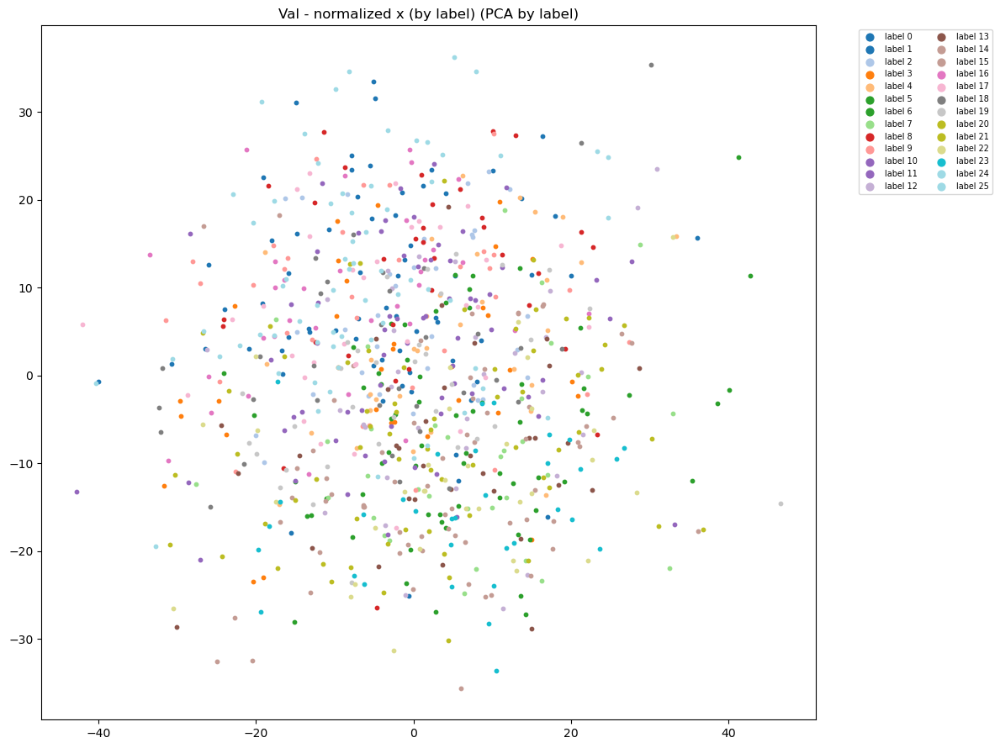

In [46]:
#val2 by label (shuffle=T)
val_iter = iter(val2_loader)

x0_val, y0_val, sid0_val = next(val_iter)
print(">>> First 30 labels from val dataloader (label y):")
print(y0_val[:30].tolist())

_, z0_val = encoder(x0_val.to(device))
z_list_val = [z0_val.detach().cpu()]
x_list_val = [x0_val.view(x0_val.size(0), -1).detach().cpu()]
label_list_val = [y0_val.cpu()]
first_30_label_val = y0_val[:30].tolist()

sid_list_val = [sid0_val.cpu()]

with torch.no_grad():
    for x, y, sid in val_iter:
        x = x.to(device)
        _, z = encoder(x)
        z_list_val.append(z.detach().cpu())
        x_list_val.append(x.view(x.size(0), -1).detach().cpu())
        label_list_val.append(y.cpu())
        sid_list_val.append(sid.cpu())

x_all_val_tensor = torch.cat(x_list_val, dim=0)
sid_all_val_tensor = torch.cat(sid_list_val, dim=0)

x_all_val_normed = torch.stack([
    (x_all_val_tensor[i] - x_stats[int(sid_all_val_tensor[i])][0].view(-1).cpu()) /
    x_stats[int(sid_all_val_tensor[i])][1].view(-1).cpu()
    for i in range(x_all_val_tensor.size(0))
])
x_all_val_normed = x_all_val_normed.numpy()

z_all_val = torch.cat(z_list_val, dim=0).numpy()
x_all_val = torch.cat(x_list_val, dim=0).numpy()
label_all_val = torch.cat(label_list_val, dim=0).numpy()
sid_all_val = torch.cat(sid_list_val, dim=0).numpy()  #

print(">>> First 30 labels used for t-SNE coloring (val):")
print(first_30_label_val)
print(">>> First 30 labels from label_all_val:")
print(label_all_val[:30].tolist())

tsne_visualize_by_label(x_all_val, label_all_val, title="Val - input x (by label)")
pca_and_plot(x_all_val, label_all_val, f"Val - input x (by label)", color_type='label')

tsne_visualize_by_label(z_all_val, label_all_val, title="Val - latent z (by label)")
pca_and_plot(z_all_val, label_all_val, f"Val - latent z(by label)", color_type='label')

tsne_visualize_by_label(x_all_val_normed, label_all_val, title="Val - normalized x (by label)")
pca_and_plot(x_all_val_normed, label_all_val, f"Val - normalized x (by label)", color_type='label')

In [47]:
results = {}

clf = LogisticRegression(max_iter=1000)
clf.fit(z_all_val, label_all_val)
acc = accuracy_score(label_all_val, clf.predict(z_all_val))
results['linear_probe_label_acc'] = acc

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(z_all_val, label_all_val)
knn_acc = accuracy_score(label_all_val, knn.predict(z_all_val))
results['knn_label_acc'] = knn_acc

kmeans_label = KMeans(n_clusters=len(np.unique(label_all_val)), random_state=0).fit(z_all_val)
ari_label = adjusted_rand_score(label_all_val, kmeans_label.labels_)
nmi_label = normalized_mutual_info_score(label_all_val, kmeans_label.labels_)
results['ARI_label'] = ari_label
results['NMI_label'] = nmi_label

sil = silhouette_score(z_all_val, label_all_val)
results['silhouette_z'] = sil

for k, v in results.items():
    print(f"{k}: {v:.4f}")


C:\Users\shaoy\anaconda3\envs\pytorch_env_p11\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


linear_probe_label_acc: 0.8939
knn_label_acc: 0.2727
ARI_label: 0.0332
NMI_label: 0.2159
silhouette_z: -0.0829


In [48]:
def tsne_visualize_inputx_by_subject(X, subject_ids, title="t-SNE of latent z (colored by subject)"):
    print(f"Running t-SNE on {len(subject_ids)} samples...")
    X_emb = TSNE(n_components=2, perplexity=30, learning_rate=200).fit_transform(X)

    unique_subjects = sorted(np.unique(subject_ids))
    n_subjects = len(unique_subjects)
    colormap = cm.get_cmap('tab20', n_subjects)

    plt.figure(figsize=(12, 9))
    for i, sid in enumerate(unique_subjects):
        idx = (subject_ids == sid)
        plt.scatter(X_emb[idx, 0], X_emb[idx, 1], label=f"Subject {sid}", color=colormap(i / n_subjects), s=10)

    plt.legend(markerscale=2, fontsize="x-small", bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
    plt.title(title)
    plt.xlabel("Component 1")
    plt.ylabel("Component 2")
    plt.tight_layout()
    plt.show()


>>> First 30 subject_ids from dataloader (sid):
[15, 32, 11, 28, 13, 26, 32, 34, 31, 18, 9, 24, 6, 2, 31, 33, 19, 14, 30, 6, 1, 10, 24, 34, 25, 27, 7, 34, 26, 3]
>>> First 30 subject_ids used for t-SNE coloring:
[15, 32, 11, 28, 13, 26, 32, 34, 31, 18, 9, 24, 6, 2, 31, 33, 19, 14, 30, 6, 1, 10, 24, 34, 25, 27, 7, 34, 26, 3]


C:\Users\shaoy\anaconda3\envs\pytorch_env_p11\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


ARI score: 0.06159037770012473
Running t-SNE on 3432 samples...


C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\460096162.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', n_subjects)


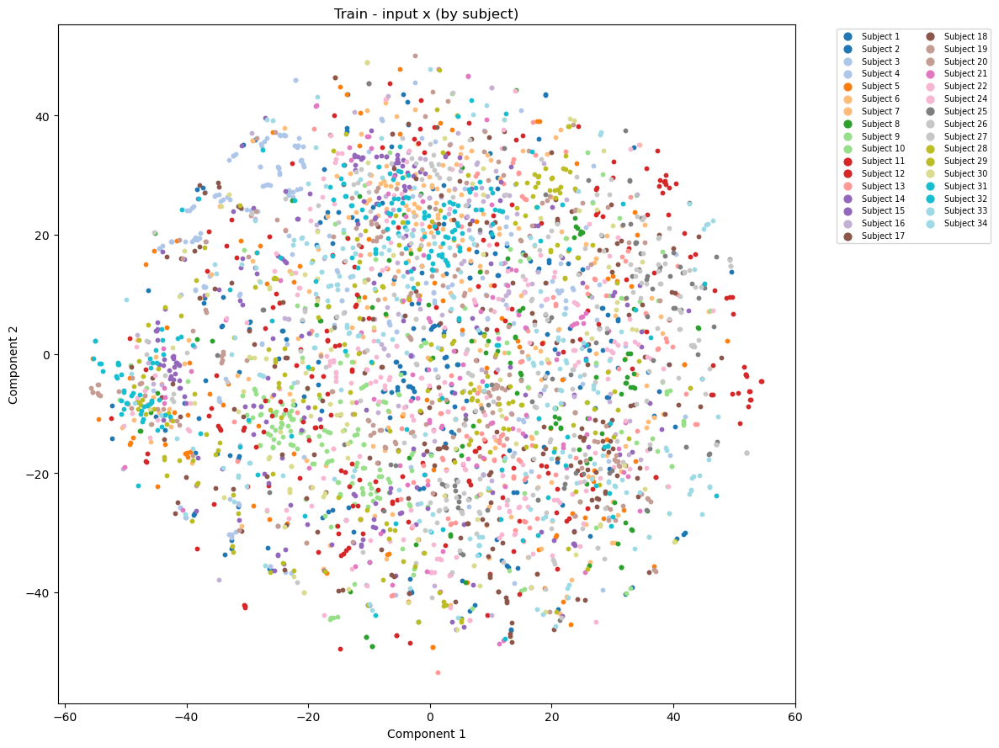

C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\2565234762.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


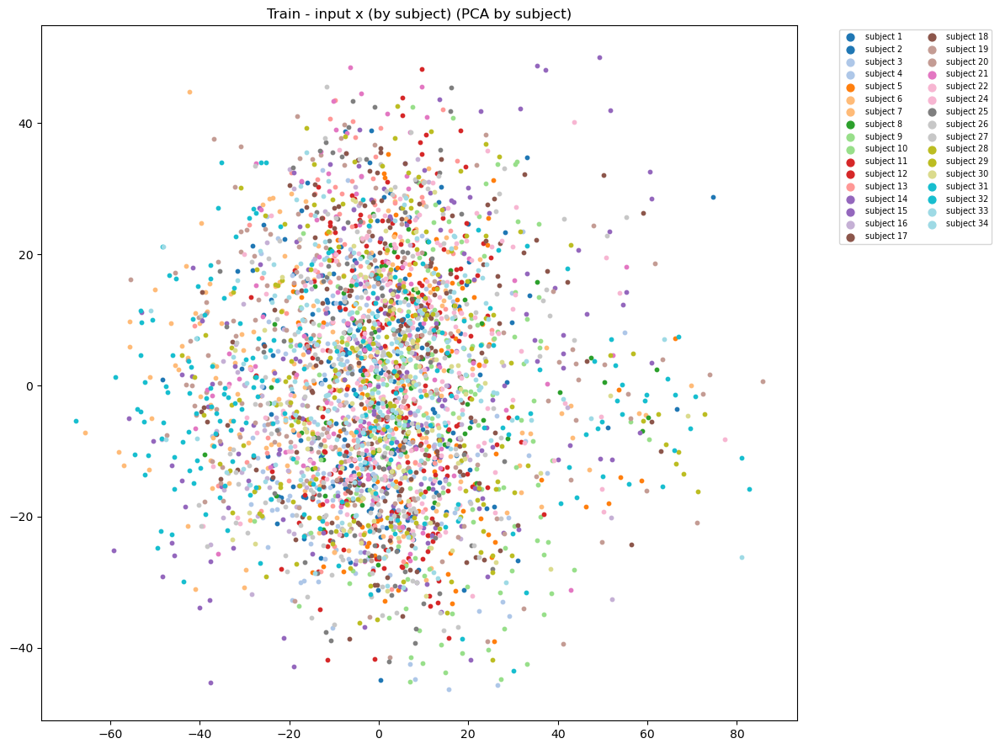

Running t-SNE on 3432 samples...


C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\460096162.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', n_subjects)


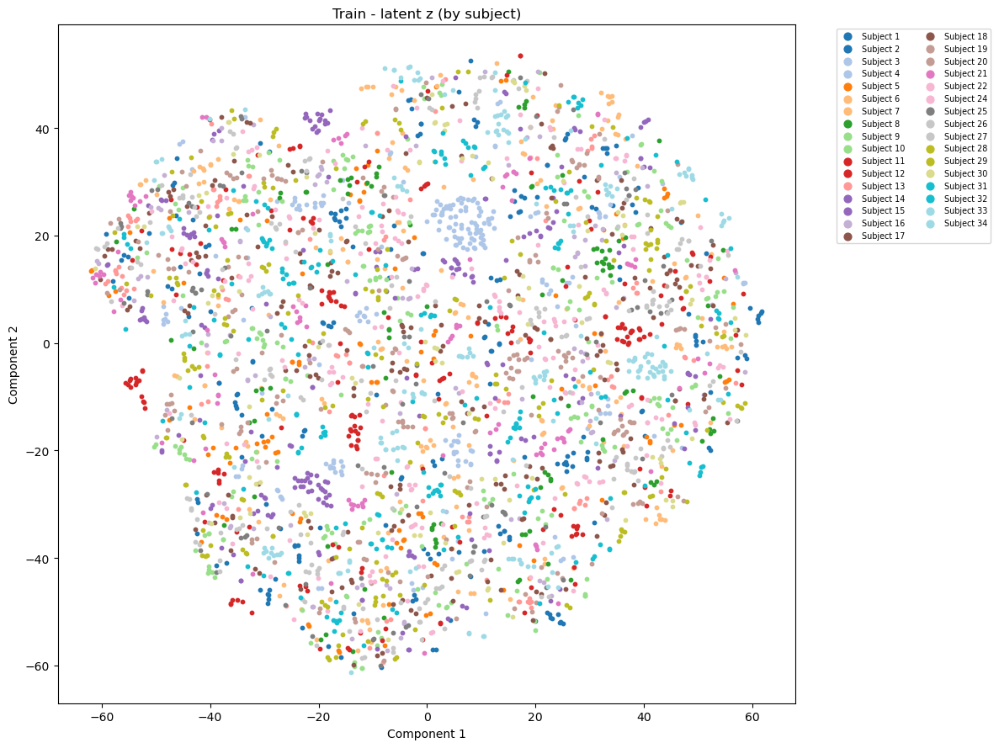

C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\2565234762.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


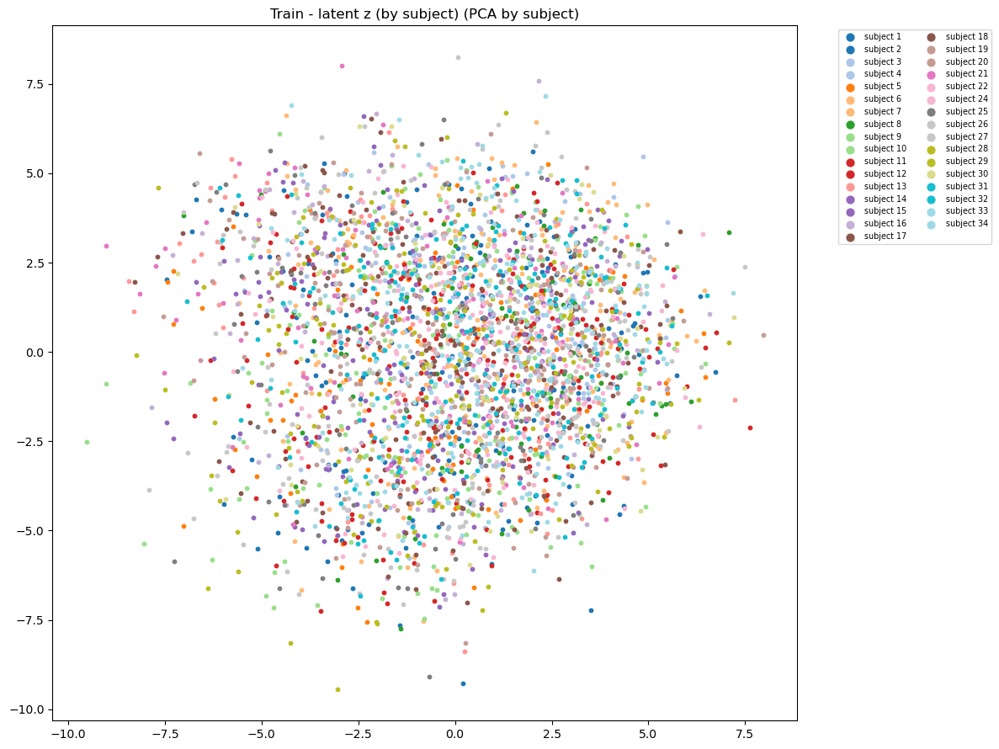

Running t-SNE on 3432 samples...


C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\460096162.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', n_subjects)


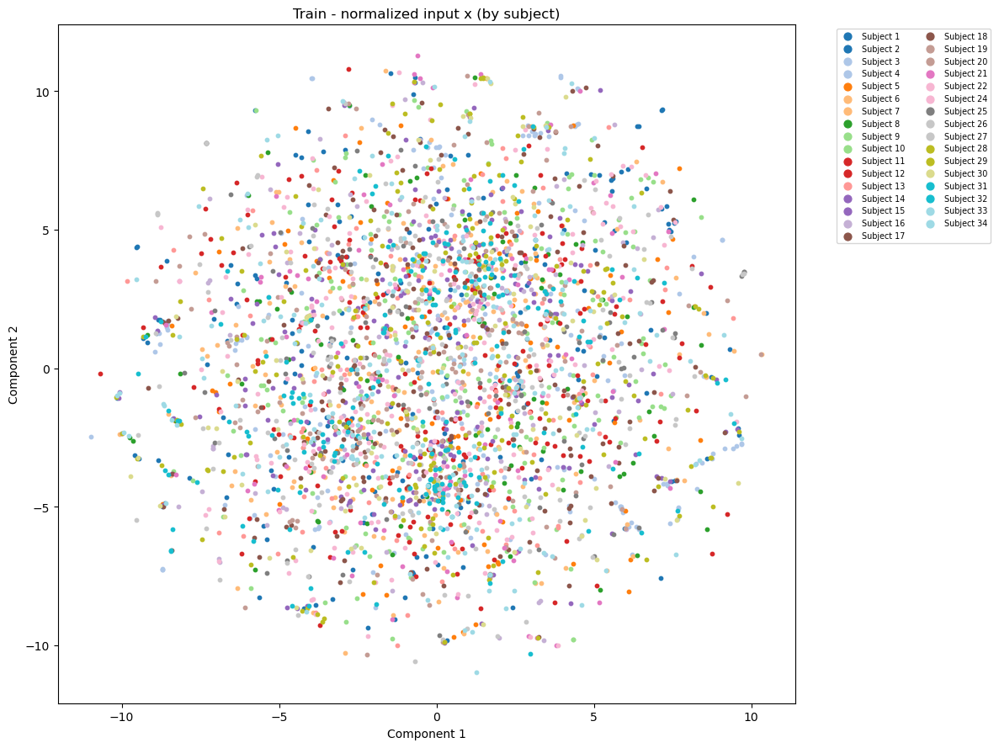

C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\2565234762.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


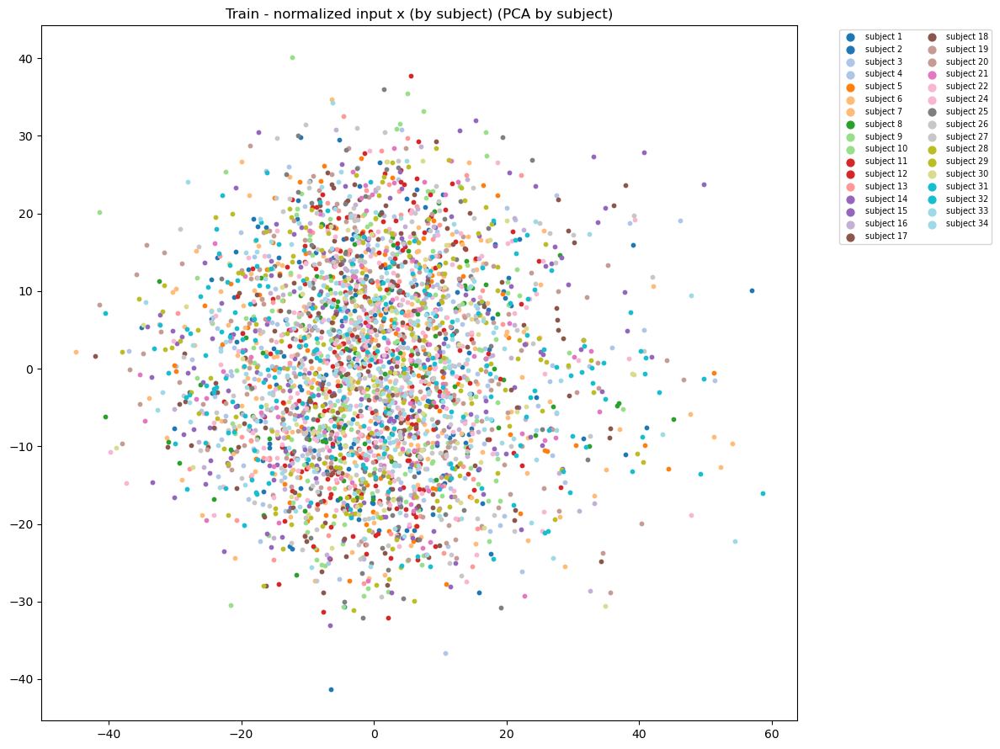

In [49]:
#train by subject
train_iter = iter(train_loader)

x0, y0, sid0 = next(train_iter)
print(">>> First 30 subject_ids from dataloader (sid):")
print(sid0[:30].tolist())

_, z0 = encoder(x0.to(device))
z_list = [z0.detach().cpu()]
x_list = [x0.view(x0.size(0), -1).detach().cpu()]
sid_list = [sid0.cpu()]
first_30_sid = sid0[:30].tolist()

with torch.no_grad():
    for x, _, sid in train_iter:
        x = x.to(device)
        _, z = encoder(x)
        z_list.append(z.detach().cpu())
        x_list.append(x.view(x.size(0), -1).detach().cpu())
        sid_list.append(sid.cpu())

x_all_tensor = torch.cat(x_list, dim=0)
sid_all_tensor = torch.cat(sid_list, dim=0)

x_all_normed = torch.stack([
    (x_all_tensor[i] - x_stats[int(sid_all_tensor[i])][0].view(-1).cpu()) /
    x_stats[int(sid_all_tensor[i])][1].view(-1).cpu()
    for i in range(x_all_tensor.size(0))
])
x_all_normed = x_all_normed.numpy()


z_all = torch.cat(z_list, dim=0).numpy()
x_all = torch.cat(x_list, dim=0).numpy()
sid_all = torch.cat(sid_list, dim=0).numpy()

print(">>> First 30 subject_ids used for t-SNE coloring:")
print(first_30_sid)

from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

kmeans = KMeans(n_clusters=33, random_state=42).fit(z_all_val)
print("ARI score:", adjusted_rand_score(sid_all_val, kmeans.labels_))

tsne_visualize_inputx_by_subject(x_all, sid_all, title="Train - input x (by subject)")
pca_and_plot(x_all, sid_all, f"Train - input x (by subject)", color_type='subject')
tsne_visualize_inputx_by_subject(z_all, sid_all, title="Train - latent z (by subject)")
pca_and_plot(z_all, sid_all, f"Train - latent z (by subject)", color_type='subject')

tsne_visualize_inputx_by_subject(x_all_normed, sid_all, title="Train - normalized input x (by subject)")
pca_and_plot(x_all_normed, sid_all, f"Train - normalized input x (by subject)", color_type='subject')


In [50]:
results = {}

clf = LogisticRegression(max_iter=1000)
clf.fit(z_all, sid_all)
acc = accuracy_score(sid_all, clf.predict(z_all))
results['linear_probe_subject_acc'] = acc

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(z_all, sid_all)
knn_acc = accuracy_score(sid_all, knn.predict(z_all))
results['knn_subject_acc'] = knn_acc

kmeans_subject = KMeans(n_clusters=len(np.unique(sid_all)), random_state=0).fit(z_all)
ari_subject = adjusted_rand_score(sid_all, kmeans_subject.labels_)
nmi_subject = normalized_mutual_info_score(sid_all, kmeans_subject.labels_)
results['ARI_subject'] = ari_subject
results['NMI_subject'] = nmi_subject

sil_subject = silhouette_score(z_all, sid_all)
results['silhouette_subject'] = sil_subject

for k, v in results.items():
    print(f"{k}: {v:.4f}")

C:\Users\shaoy\anaconda3\envs\pytorch_env_p11\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=14.
  warnings.warn(


linear_probe_subject_acc: 1.0000
knn_subject_acc: 0.8196
ARI_subject: 0.0140
NMI_subject: 0.1019
silhouette_subject: -0.0150


>>> First 30 subject_ids from val dataloader (sid):
[27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 34, 34, 34, 34]
>>> First 30 subject_ids used for t-SNE coloring (val):
[27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 34, 34, 34, 34]
>>> First 30 subject_ids from sid_all_val:
[27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 34, 34, 34, 34]
Running t-SNE on 858 samples...


C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\460096162.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', n_subjects)


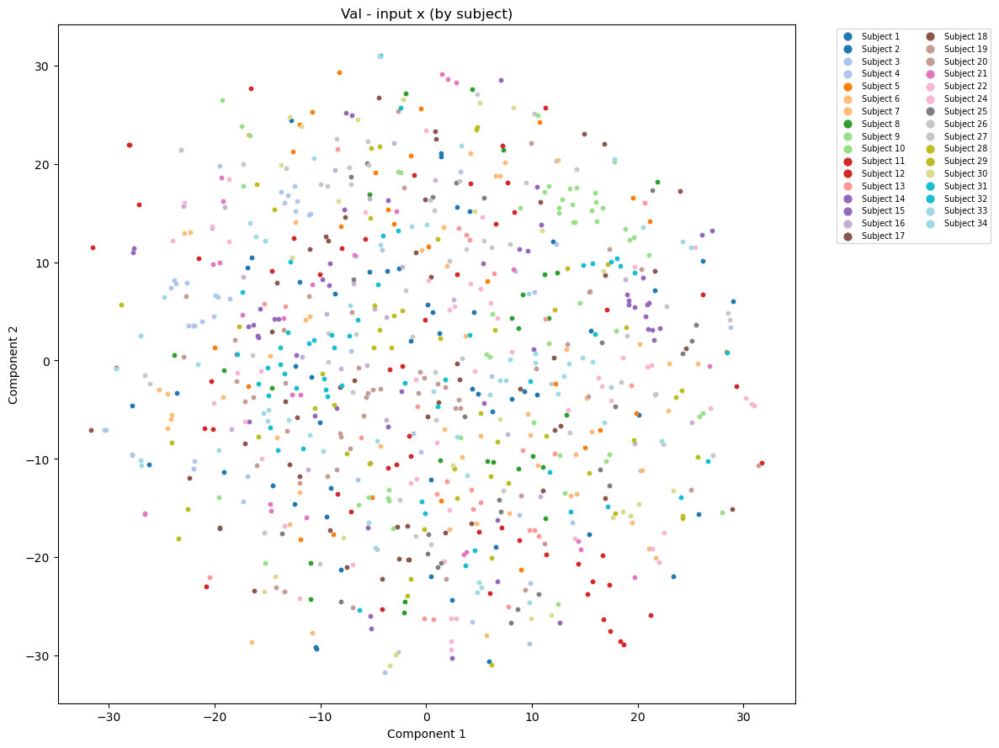

C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\2565234762.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


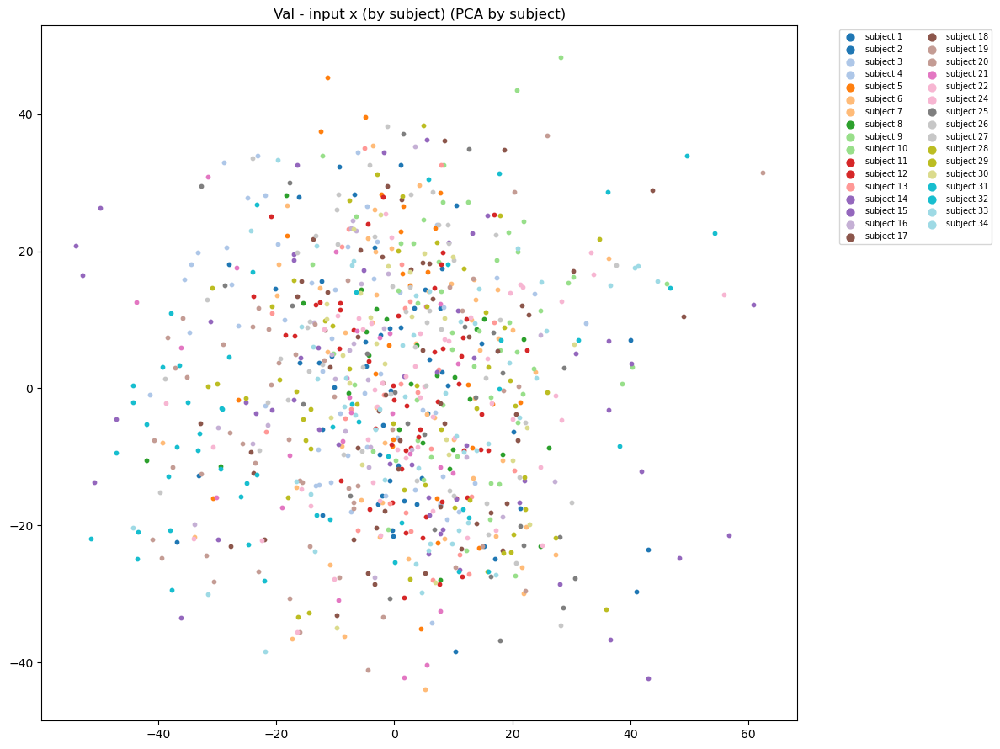

Running t-SNE on 858 samples...


C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\460096162.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', n_subjects)


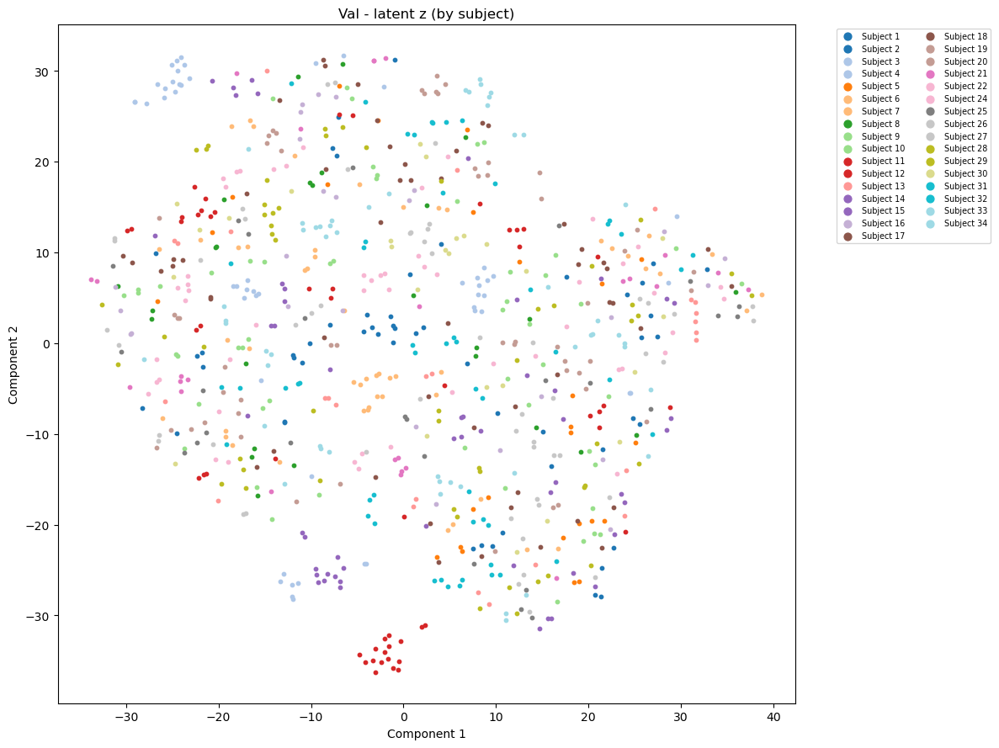

C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\2565234762.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


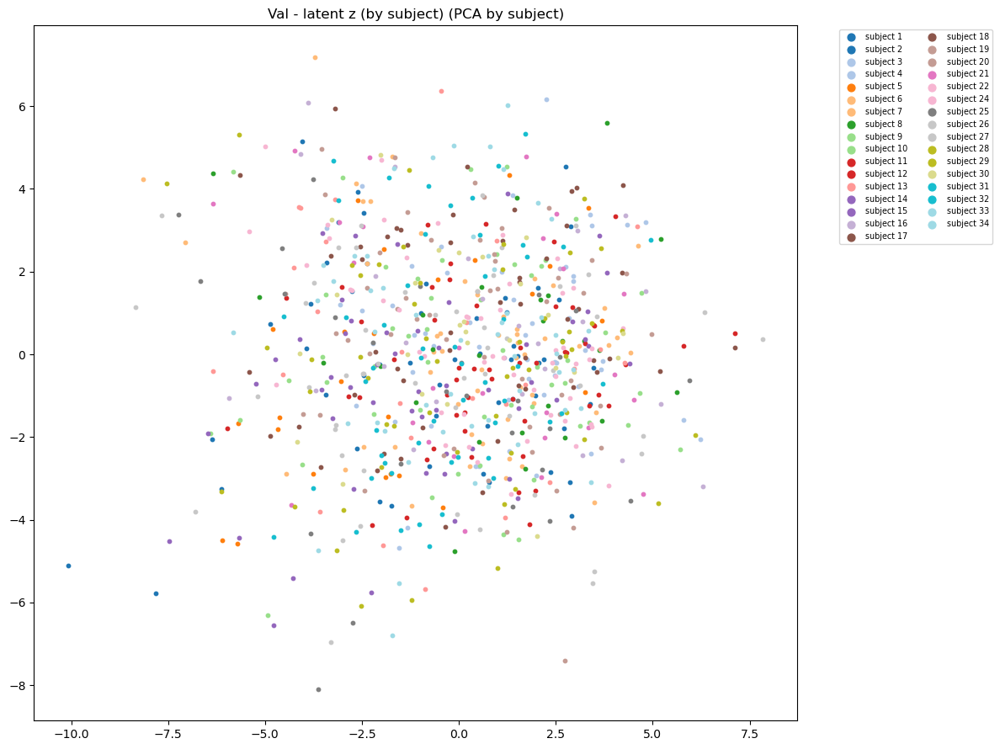

Running t-SNE on 858 samples...


C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\460096162.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', n_subjects)


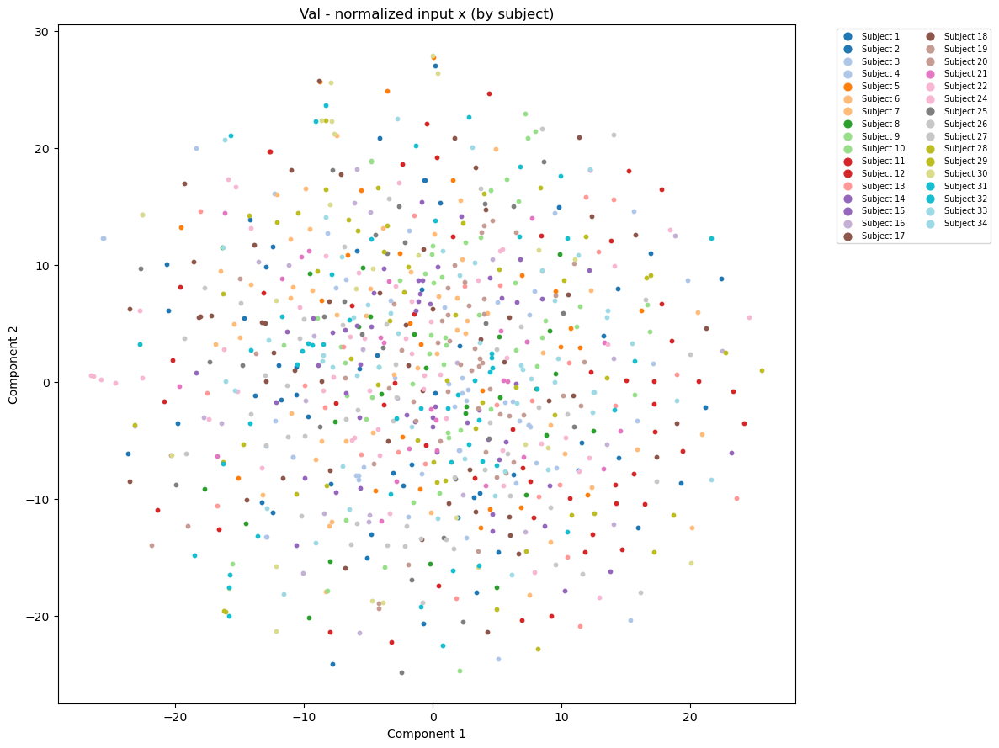

C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\2565234762.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


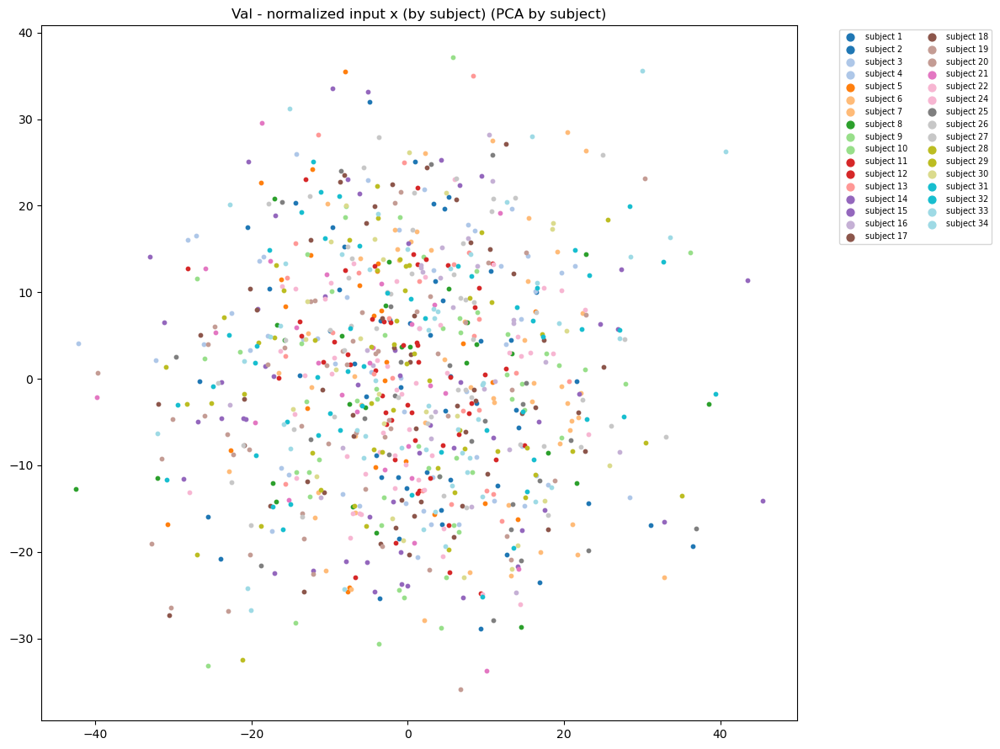

In [51]:
#val by subject (shuffle = F)
val_iter = iter(val_loader)

x0_val, y0_val, sid0_val = next(val_iter)
print(">>> First 30 subject_ids from val dataloader (sid):")
print(sid0_val[:30].tolist())

_, z0_val = encoder(x0_val.to(device))
z_list_val = [z0_val.detach().cpu()]
x_list_val = [x0_val.view(x0_val.size(0), -1).detach().cpu()]
sid_list_val = [sid0_val.cpu()]
first_30_sid_val = sid0_val[:30].tolist()

with torch.no_grad():
    for x, _, sid in val_iter:
        x = x.to(device)
        _, z = encoder(x)
        z_list_val.append(z.detach().cpu())
        x_list_val.append(x.view(x.size(0), -1).detach().cpu())
        sid_list_val.append(sid.cpu())

x_all_val_tensor = torch.cat(x_list_val, dim=0)
sid_all_val_tensor = torch.cat(sid_list_val, dim=0)

x_all_val_normed = torch.stack([
    (x_all_val_tensor[i] - x_stats[int(sid_all_val_tensor[i])][0].view(-1).cpu()) /
    x_stats[int(sid_all_val_tensor[i])][1].view(-1).cpu()
    for i in range(x_all_val_tensor.size(0))
])
x_all_val_normed = x_all_val_normed.numpy()

z_all_val = torch.cat(z_list_val, dim=0).numpy()
x_all_val = torch.cat(x_list_val, dim=0).numpy()
sid_all_val = torch.cat(sid_list_val, dim=0).numpy()

print(">>> First 30 subject_ids used for t-SNE coloring (val):")
print(first_30_sid_val)
print(">>> First 30 subject_ids from sid_all_val:")
print(sid_all_val[:30].tolist())

tsne_visualize_inputx_by_subject(x_all_val, sid_all_val, title="Val - input x (by subject)")
pca_and_plot(x_all_val, sid_all_val, f"Val - input x (by subject)", color_type='subject')
tsne_visualize_inputx_by_subject(z_all_val, sid_all_val, title="Val - latent z (by subject)")
pca_and_plot(z_all_val, sid_all_val, f"Val - latent z (by subject)", color_type='subject')

tsne_visualize_inputx_by_subject(x_all_val_normed, sid_all_val, title="Val - normalized input x (by subject)")
pca_and_plot(x_all_val_normed, sid_all_val, f"Val - normalized input x (by subject)", color_type='subject')



In [52]:
results = {}

clf = LogisticRegression(max_iter=1000)
clf.fit(z_all_val, sid_all_val)
acc = accuracy_score(sid_all_val, clf.predict(z_all_val))
results['linear_probe_subject_acc'] = acc

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(z_all_val, sid_all_val)
knn_acc = accuracy_score(sid_all_val, knn.predict(z_all_val))
results['knn_subject_acc'] = knn_acc

kmeans_subject = KMeans(n_clusters=len(np.unique(sid_all_val)), random_state=0).fit(z_all_val)
ari_subject = adjusted_rand_score(sid_all_val, kmeans_subject.labels_)
nmi_subject = normalized_mutual_info_score(sid_all_val, kmeans_subject.labels_)
results['ARI_subject'] = ari_subject
results['NMI_subject'] = nmi_subject

sil_subject = silhouette_score(z_all_val, sid_all_val)
results['silhouette_subject'] = sil_subject

for k, v in results.items():
    print(f"{k}: {v:.4f}")

C:\Users\shaoy\anaconda3\envs\pytorch_env_p11\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


linear_probe_subject_acc: 1.0000
knn_subject_acc: 0.7564
ARI_subject: 0.0520
NMI_subject: 0.2955
silhouette_subject: -0.0186


>>> First 30 subject_ids from val dataloader (sid):
[28, 27, 26, 11, 29, 15, 6, 10, 15, 34, 12, 10, 14, 13, 8, 22, 29, 9, 18, 1, 6, 11, 24, 25, 29, 9, 14, 30, 6, 12]
>>> First 30 subject_ids used for t-SNE coloring (val):
[28, 27, 26, 11, 29, 15, 6, 10, 15, 34, 12, 10, 14, 13, 8, 22, 29, 9, 18, 1, 6, 11, 24, 25, 29, 9, 14, 30, 6, 12]
>>> First 30 subject_ids from sid_all_val:
[28, 27, 26, 11, 29, 15, 6, 10, 15, 34, 12, 10, 14, 13, 8, 22, 29, 9, 18, 1, 6, 11, 24, 25, 29, 9, 14, 30, 6, 12]
Running t-SNE on 858 samples...


C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\460096162.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', n_subjects)


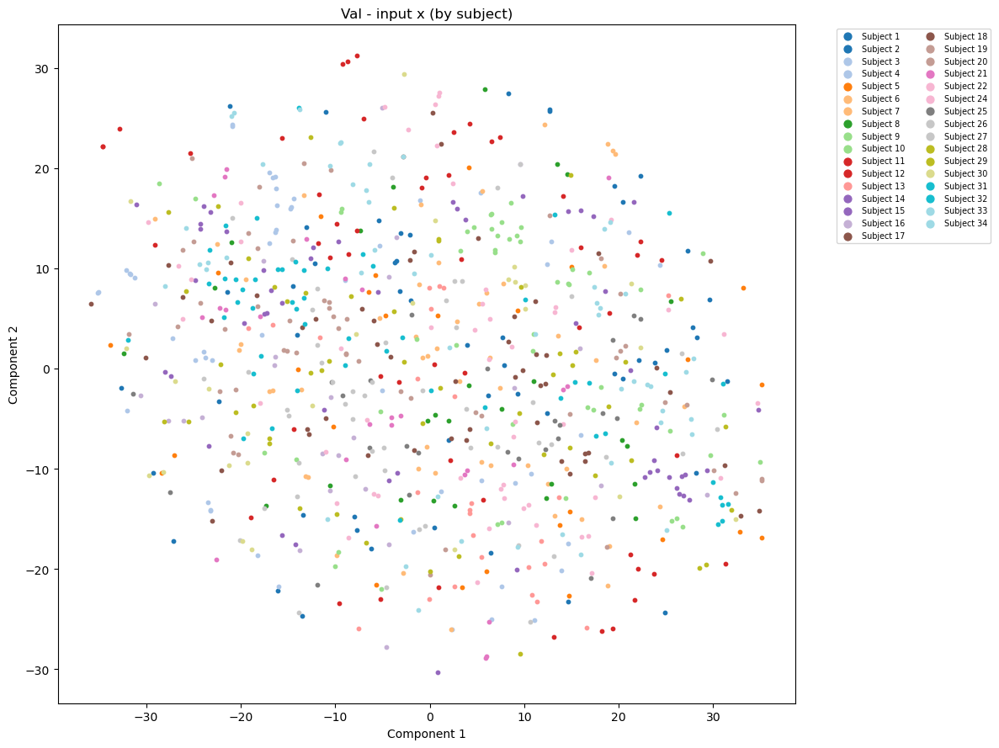

C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\2565234762.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


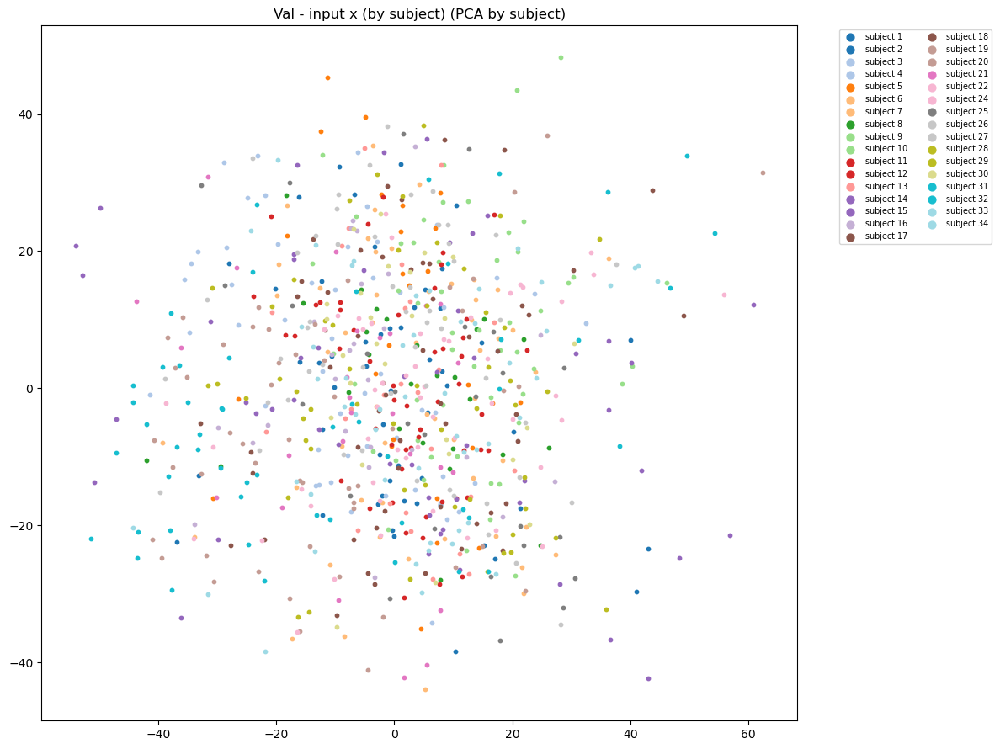

Running t-SNE on 858 samples...


C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\460096162.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', n_subjects)


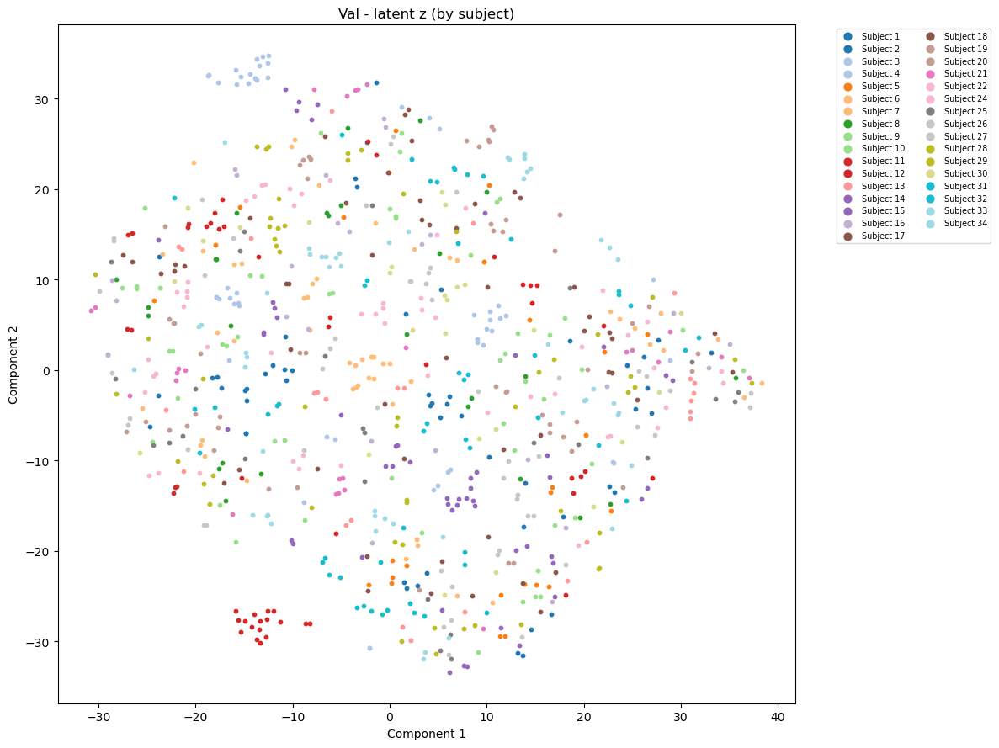

C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\2565234762.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


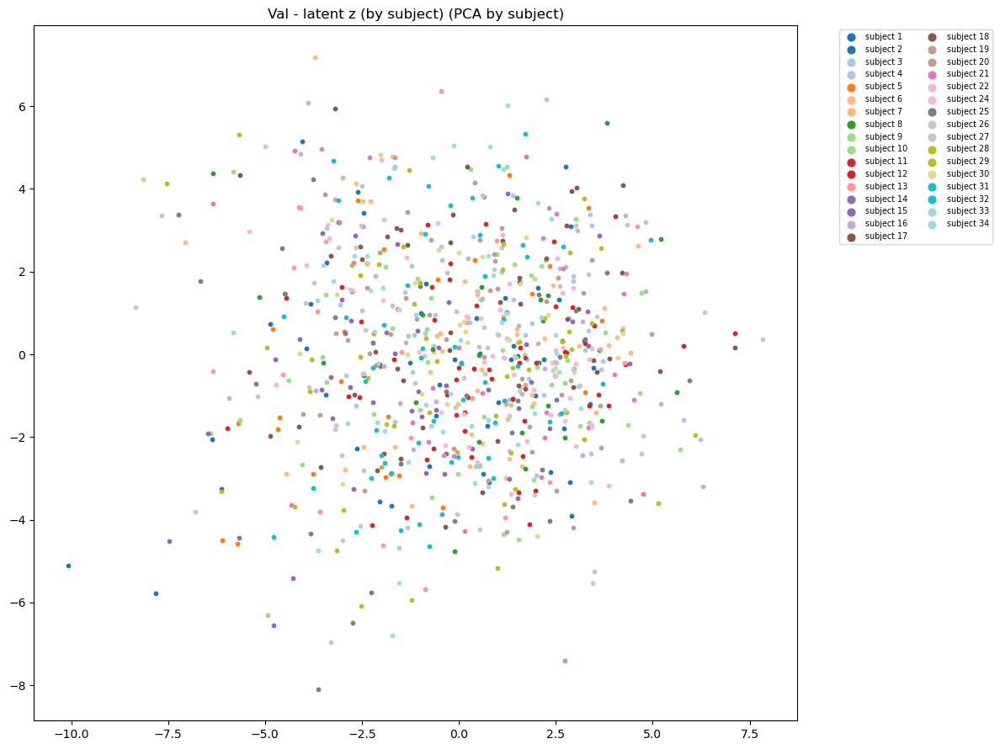

Running t-SNE on 858 samples...


C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\460096162.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', n_subjects)


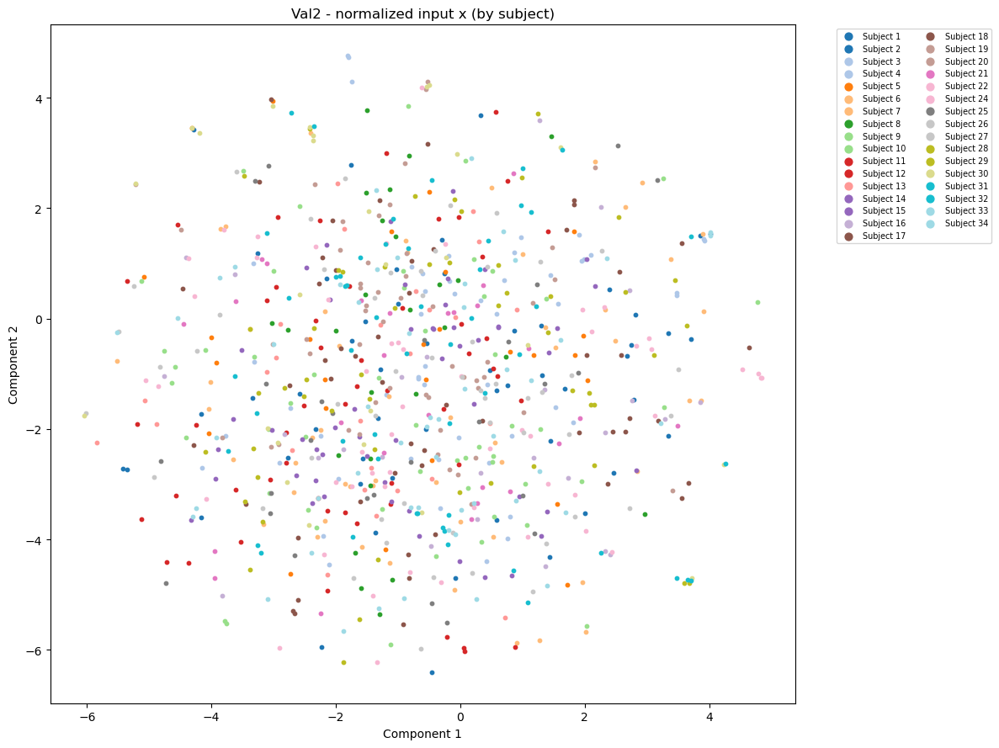

C:\Users\shaoy\AppData\Local\Temp\ipykernel_26592\2565234762.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(classes))


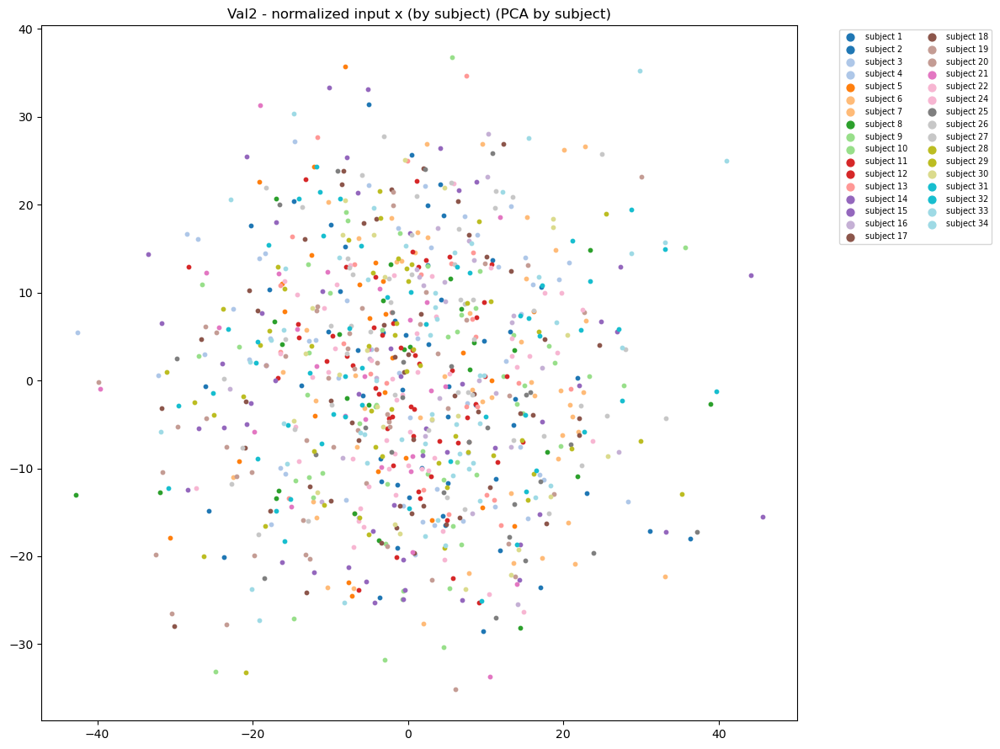

In [53]:
#val2 by subject (shuffle = T)
val_iter = iter(val2_loader)

x0_val, y0_val, sid0_val = next(val_iter)
print(">>> First 30 subject_ids from val dataloader (sid):")
print(sid0_val[:30].tolist())

_, z0_val = encoder(x0_val.to(device))
z_list_val = [z0_val.detach().cpu()]
x_list_val = [x0_val.view(x0_val.size(0), -1).detach().cpu()]
sid_list_val = [sid0_val.cpu()]
first_30_sid_val = sid0_val[:30].tolist()

with torch.no_grad():
    for x, _, sid in val_iter:
        x = x.to(device)
        _, z = encoder(x)
        z_list_val.append(z.detach().cpu())
        x_list_val.append(x.view(x.size(0), -1).detach().cpu())
        sid_list_val.append(sid.cpu())

x_all_val_tensor = torch.cat(x_list_val, dim=0)
sid_all_val_tensor = torch.cat(sid_list_val, dim=0)

x_all_val_normed = torch.stack([
    (x_all_val_tensor[i] - x_stats[int(sid_all_val_tensor[i])][0].view(-1).cpu()) /
    x_stats[int(sid_all_val_tensor[i])][1].view(-1).cpu()
    for i in range(x_all_val_tensor.size(0))
])
x_all_val_normed = x_all_val_normed.numpy()

z_all_val = torch.cat(z_list_val, dim=0).numpy()
x_all_val = torch.cat(x_list_val, dim=0).numpy()
sid_all_val = torch.cat(sid_list_val, dim=0).numpy()

print(">>> First 30 subject_ids used for t-SNE coloring (val):")
print(first_30_sid_val)
print(">>> First 30 subject_ids from sid_all_val:")
print(sid_all_val[:30].tolist())

tsne_visualize_inputx_by_subject(x_all_val, sid_all_val, title="Val - input x (by subject)")
pca_and_plot(x_all_val, sid_all_val, f"Val - input x (by subject)", color_type='subject')
tsne_visualize_inputx_by_subject(z_all_val, sid_all_val, title="Val - latent z (by subject)")
pca_and_plot(z_all_val, sid_all_val, f"Val - latent z (by subject)", color_type='subject')

tsne_visualize_inputx_by_subject(x_all_val_normed, sid_all_val, title="Val2 - normalized input x (by subject)")
pca_and_plot(x_all_val_normed, sid_all_val, f"Val2 - normalized input x (by subject)", color_type='subject')


In [54]:
results = {}

clf = LogisticRegression(max_iter=1000)
clf.fit(z_all_val, sid_all_val)
acc = accuracy_score(sid_all_val, clf.predict(z_all_val))
results['linear_probe_subject_acc'] = acc

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(z_all_val, sid_all_val)
knn_acc = accuracy_score(sid_all_val, knn.predict(z_all_val))
results['knn_subject_acc'] = knn_acc

kmeans_subject = KMeans(n_clusters=len(np.unique(sid_all_val)), random_state=0).fit(z_all_val)
ari_subject = adjusted_rand_score(sid_all_val, kmeans_subject.labels_)
nmi_subject = normalized_mutual_info_score(sid_all_val, kmeans_subject.labels_)
results['ARI_subject'] = ari_subject
results['NMI_subject'] = nmi_subject

sil_subject = silhouette_score(z_all_val, sid_all_val)
results['silhouette_subject'] = sil_subject

for k, v in results.items():
    print(f"{k}: {v:.4f}")

C:\Users\shaoy\anaconda3\envs\pytorch_env_p11\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


linear_probe_subject_acc: 1.0000
knn_subject_acc: 0.7564
ARI_subject: 0.0591
NMI_subject: 0.3063
silhouette_subject: -0.0186
